In [38]:
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
import warnings
from joblib import dump
import matplotlib.pyplot as plt
import numpy as np

warnings.filterwarnings("ignore")

In [39]:
df = pd.read_csv("cleaned_data.csv")
df.shape

(1579732, 15)

In [40]:
df["date"] = pd.to_datetime(df["date"])
df["year"] = df["date"].dt.year
df["month"] = df["date"].dt.month
df["day"] = df["date"].dt.day
df["hour"] = pd.to_datetime(df["time"]).dt.hour
df["minute"] = df["date"].dt.minute
df["day_of_week"] = df["date"].dt.dayofweek

In [41]:
df

,lon,lat,id,temp,feels_like,weather_description,wind_speed,humidity,curr_time,number,...,available_bike_stands,last_update,date,time,year,month,day,hour,minute,day_of_week
0,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,1,...,4,2024-02-21 18:56:44,2024-02-21,19:00:00,2024,2,21,19,0,2
1,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,2,...,16,2024-02-21 18:56:08,2024-02-21,19:00:00,2024,2,21,19,0,2
2,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,3,...,12,2024-02-21 18:57:07,2024-02-21,19:00:00,2024,2,21,19,0,2
3,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,4,...,15,2024-02-21 18:57:57,2024-02-21,19:00:00,2024,2,21,19,0,2
4,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,5,...,3,2024-02-21 18:57:12,2024-02-21,19:00:00,2024,2,21,19,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1579727,-7.7783,53.2734,804,280.49,278.71,overcast clouds,2.65,93,2024-04-04 09:00:00,110,...,27,2024-04-04 09:27:55,2024-04-04,09:00:00,2024,4,4,9,0,3
1579728,-7.7783,53.2734,804,280.49,278.71,overcast clouds,2.65,93,2024-04-04 09:00:00,113,...,34,2024-04-04 09:27:46,2024-04-04,09:00:00,2024,4,4,9,0,3
1579729,-7.7783,53.2734,804,280.49,278.71,overcast clouds,2.65,93,2024-04-04 09:00:00,114,...,20,2024-04-04 09:29:11,2024-04-04,09:00:00,2024,4,4,9,0,3
1579730,-7.7783,53.2734,804,280.49,278.71,overcast clouds,2.65,93,2024-04-04 09:00:00,115,...,12,2024-04-04 09:26:22,2024-04-04,09:00:00,2024,4,4,9,0,3


In [42]:
df_non_zero_hours = df[df["hour"] != 0]
df_non_zero_hours

,lon,lat,id,temp,feels_like,weather_description,wind_speed,humidity,curr_time,number,...,available_bike_stands,last_update,date,time,year,month,day,hour,minute,day_of_week
0,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,1,...,4,2024-02-21 18:56:44,2024-02-21,19:00:00,2024,2,21,19,0,2
1,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,2,...,16,2024-02-21 18:56:08,2024-02-21,19:00:00,2024,2,21,19,0,2
2,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,3,...,12,2024-02-21 18:57:07,2024-02-21,19:00:00,2024,2,21,19,0,2
3,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,4,...,15,2024-02-21 18:57:57,2024-02-21,19:00:00,2024,2,21,19,0,2
4,-7.7783,53.2734,803,281.04,277.27,broken clouds,7.35,85,2024-02-21 19:00:00,5,...,3,2024-02-21 18:57:12,2024-02-21,19:00:00,2024,2,21,19,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1579727,-7.7783,53.2734,804,280.49,278.71,overcast clouds,2.65,93,2024-04-04 09:00:00,110,...,27,2024-04-04 09:27:55,2024-04-04,09:00:00,2024,4,4,9,0,3
1579728,-7.7783,53.2734,804,280.49,278.71,overcast clouds,2.65,93,2024-04-04 09:00:00,113,...,34,2024-04-04 09:27:46,2024-04-04,09:00:00,2024,4,4,9,0,3
1579729,-7.7783,53.2734,804,280.49,278.71,overcast clouds,2.65,93,2024-04-04 09:00:00,114,...,20,2024-04-04 09:29:11,2024-04-04,09:00:00,2024,4,4,9,0,3
1579730,-7.7783,53.2734,804,280.49,278.71,overcast clouds,2.65,93,2024-04-04 09:00:00,115,...,12,2024-04-04 09:26:22,2024-04-04,09:00:00,2024,4,4,9,0,3


In [43]:
df_for_cov = df[
    [
        "temp",
        "feels_like",
        "wind_speed",
        "humidity",
        "available_bikes",
        "available_bike_stands",
        "year",
        "month",
        "day",
        "hour",
        "minute",
        "day_of_week",
    ]
]
covariance_matrix = df_for_cov.cov()
covariance_matrix

,temp,feels_like,wind_speed,humidity,available_bikes,available_bike_stands,year,month,day,hour,minute,day_of_week
temp,9.027965,11.836465,0.929274,-7.062577,-0.541063,0.428493,0.0,0.418648,1.894428,4.861348,0.0,-1.359855
feels_like,11.836465,16.503668,-0.253509,-6.137234,-0.702582,0.542570,0.0,0.594759,2.840263,6.370556,0.0,-1.880159
wind_speed,0.929274,-0.253509,3.450531,-3.483297,-0.091382,0.089966,0.0,-0.081016,-0.692410,0.526346,0.0,-0.021160
humidity,-7.062577,-6.137234,-3.483297,83.855804,0.591886,-0.574982,0.0,0.666269,-15.742003,-12.249298,0.0,0.733535
available_bikes,-0.541063,-0.702582,-0.091382,0.591886,98.742027,-84.037834,0.0,-0.017999,0.065647,-0.393454,0.0,0.200055
available_bike_stands,0.428493,0.542570,0.089966,-0.574982,-84.037834,125.623692,0.0,-0.000668,0.150064,0.251501,0.0,-0.246658
year,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000
month,0.418648,0.594759,-0.081016,0.666269,-0.017999,-0.000668,0.0,0.331865,-3.946941,-0.157145,0.0,0.003305
day,1.894428,2.840263,-0.692410,-15.742003,0.065647,0.150064,0.0,-3.946941,97.440296,3.265037,0.0,-2.124458
hour,4.861348,6.370556,0.526346,-12.249298,-0.393454,0.251501,0.0,-0.157145,3.265037,44.730579,0.0,-0.438998


Number of predictions for station 1: 2875
new R^2 Score: 0.9608297658466559
Accuracy: 0.4483478260869565


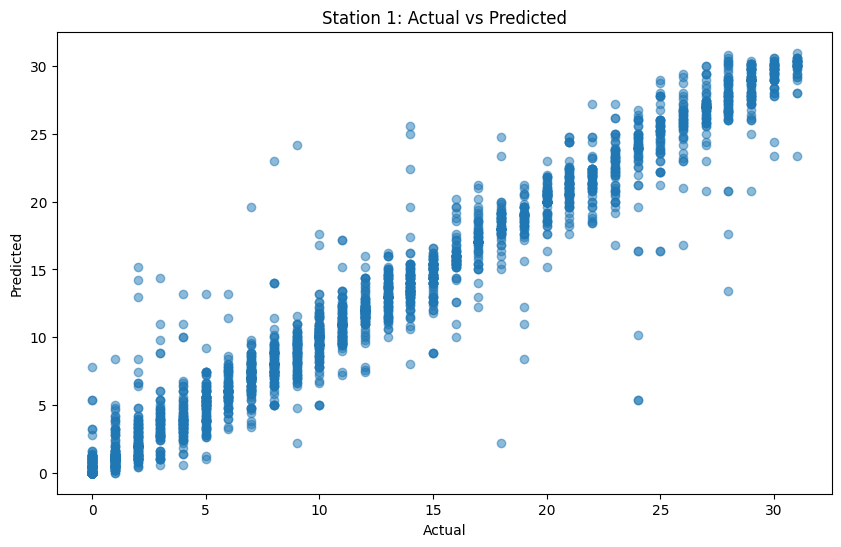

--------------------------------------------------
Number of predictions for station 2: 2619
new R^2 Score: 0.9270512106344067
Accuracy: 0.5933562428407789


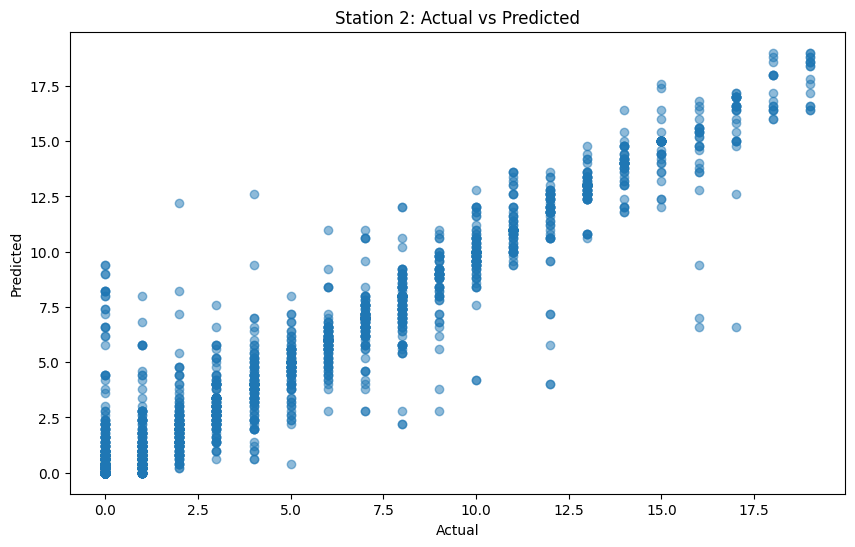

--------------------------------------------------
Number of predictions for station 3: 2796
new R^2 Score: 0.9671115176866096
Accuracy: 0.5286123032904149


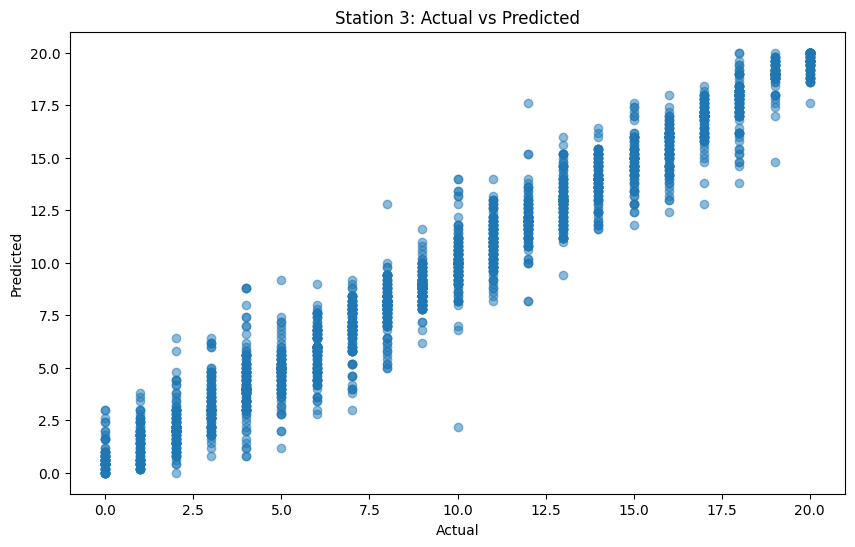

--------------------------------------------------
Number of predictions for station 4: 2660
new R^2 Score: 0.9545362292658206
Accuracy: 0.6323308270676692


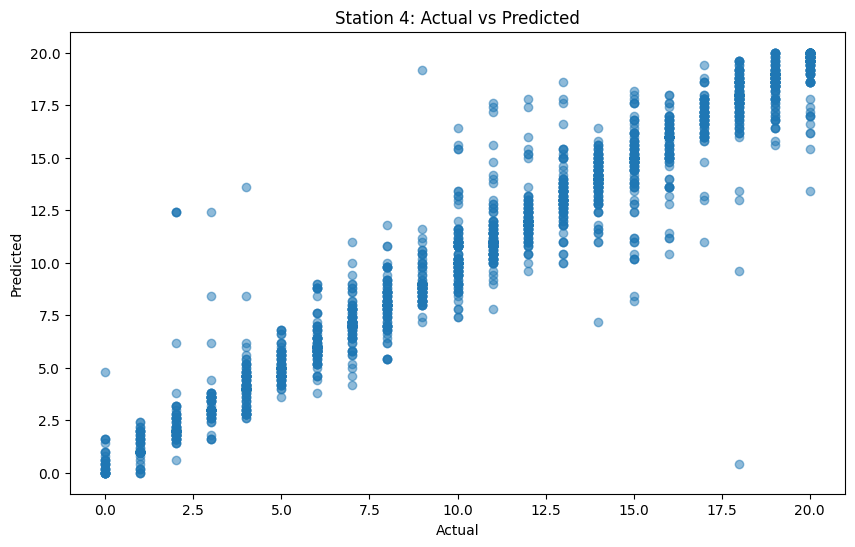

--------------------------------------------------
Number of predictions for station 5: 3175
new R^2 Score: 0.9486164056624571
Accuracy: 0.4025196850393701


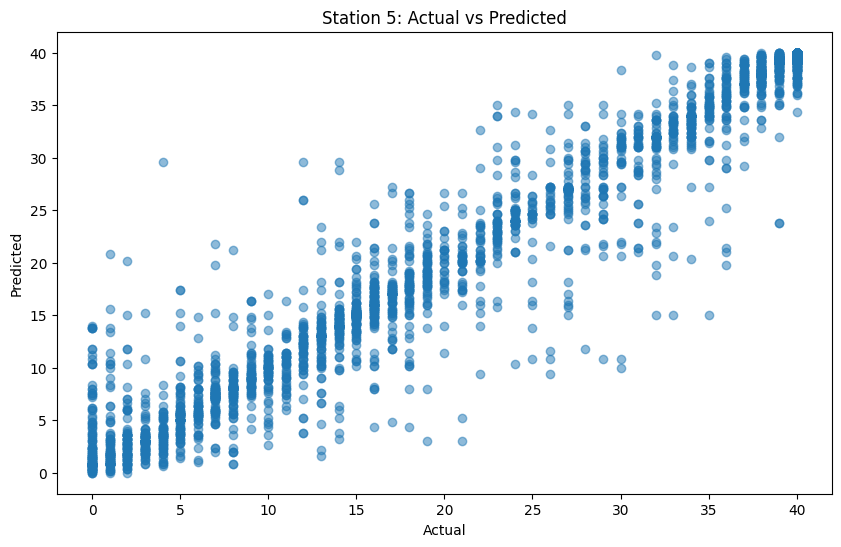

--------------------------------------------------
Number of predictions for station 6: 2707
new R^2 Score: 0.9598878666515782
Accuracy: 0.5504248245289989


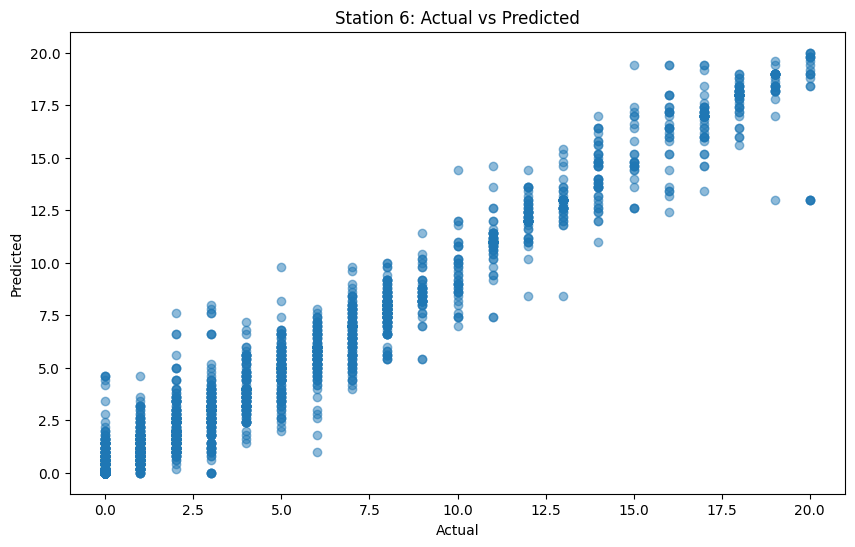

--------------------------------------------------
Number of predictions for station 7: 2614
new R^2 Score: 0.956961903825882
Accuracy: 0.6224177505738332


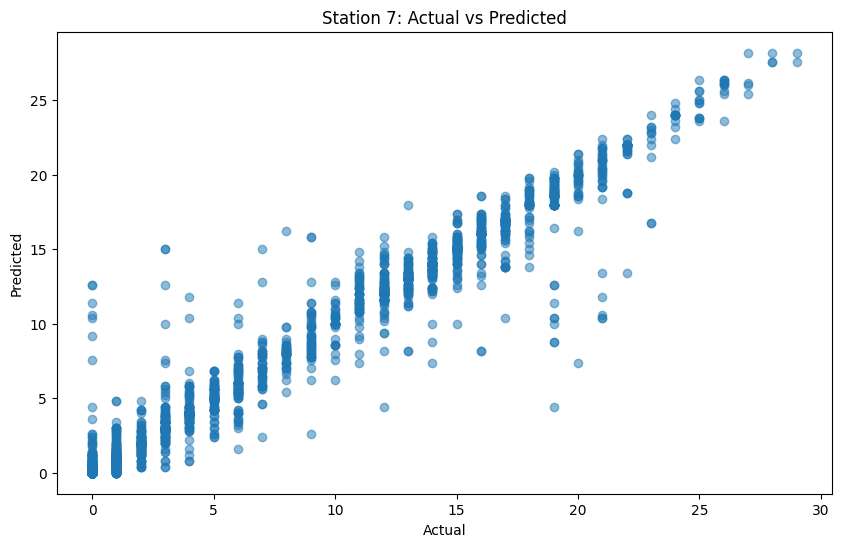

--------------------------------------------------
Number of predictions for station 8: 3010
new R^2 Score: 0.9268414284385842
Accuracy: 0.4325581395348837


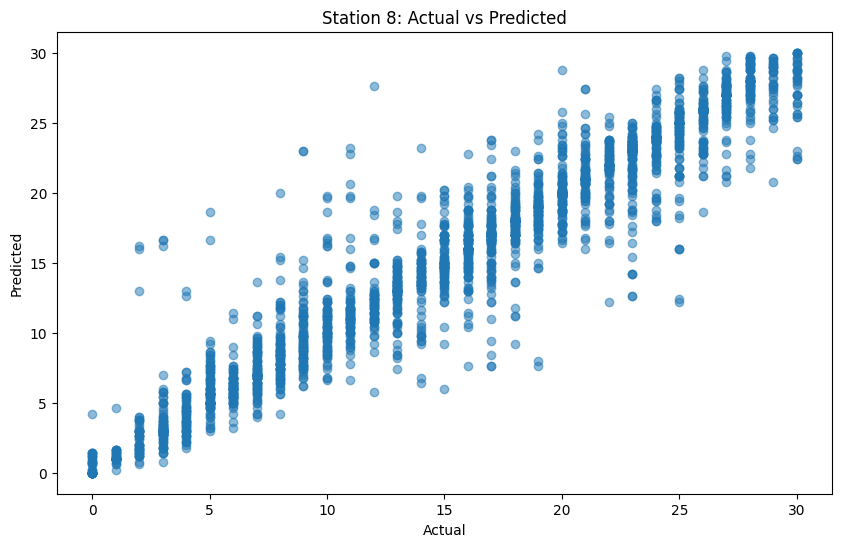

--------------------------------------------------
Number of predictions for station 9: 3137
new R^2 Score: 0.914732623437548
Accuracy: 0.385718839655722


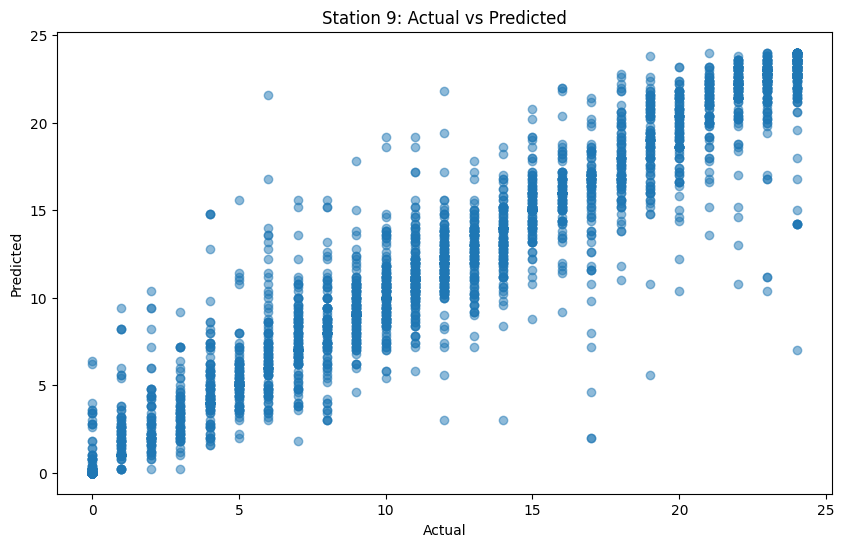

--------------------------------------------------
Number of predictions for station 10: 2885
new R^2 Score: 0.9008178734569572
Accuracy: 0.5320623916811091


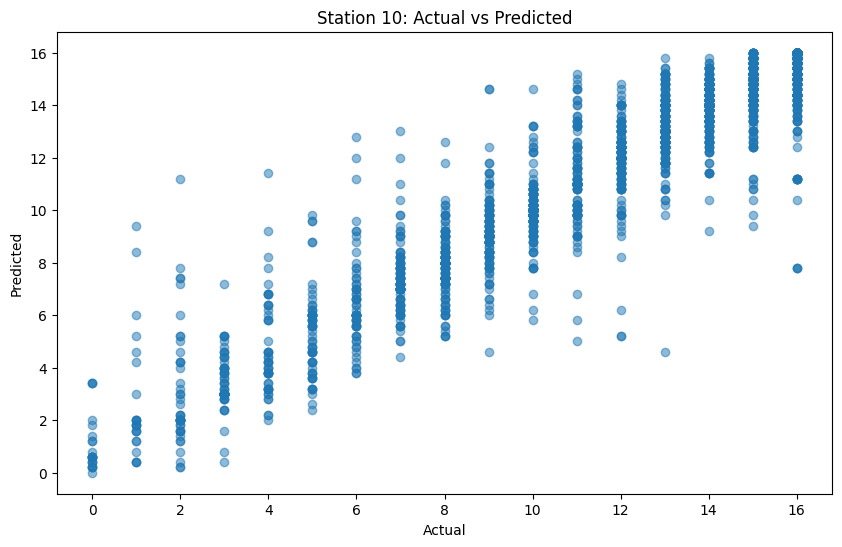

--------------------------------------------------
Number of predictions for station 11: 2554
new R^2 Score: 0.9761005242864473
Accuracy: 0.6593578700078309


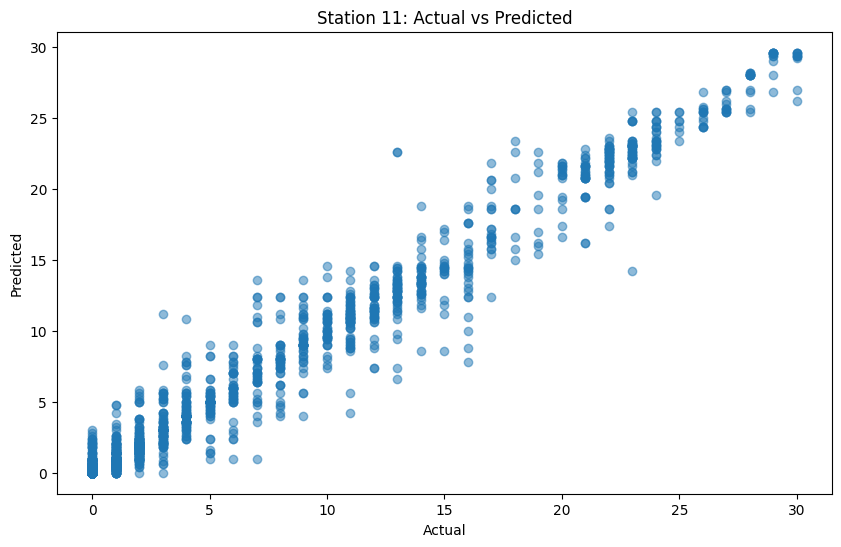

--------------------------------------------------
Number of predictions for station 12: 2591
new R^2 Score: 0.9577105760196606
Accuracy: 0.6217676572751833


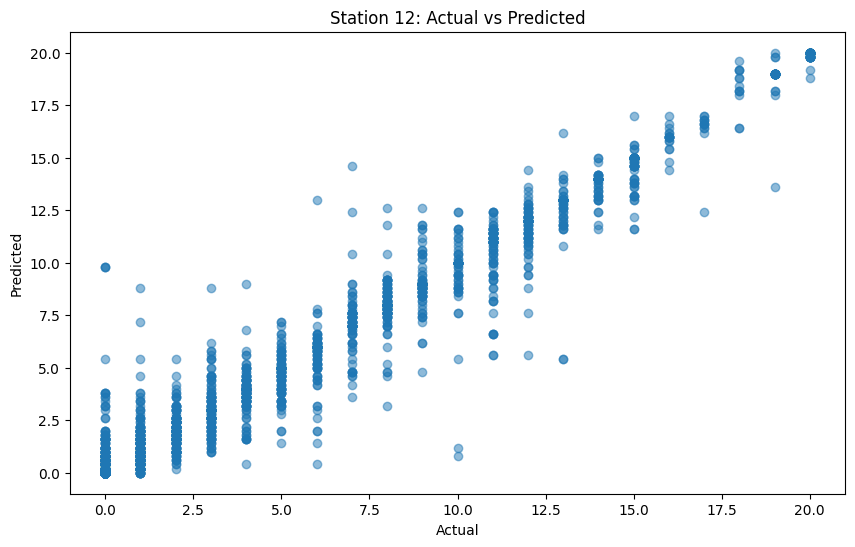

--------------------------------------------------
Number of predictions for station 13: 2560
new R^2 Score: 0.959264441956204
Accuracy: 0.68359375


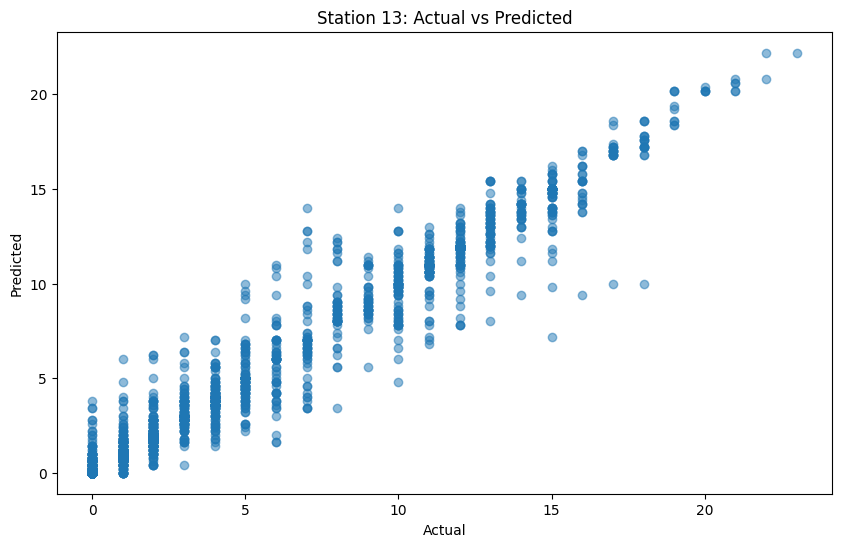

--------------------------------------------------
Number of predictions for station 14: 3013
new R^2 Score: 0.9064810283720467
Accuracy: 0.40491204779289747


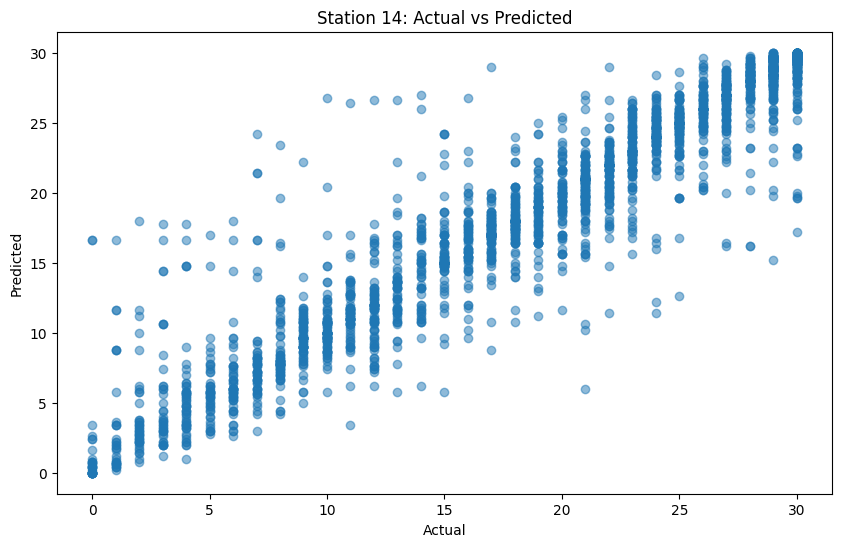

--------------------------------------------------
Number of predictions for station 15: 2648
new R^2 Score: 0.9306079459013569
Accuracy: 0.6185800604229608


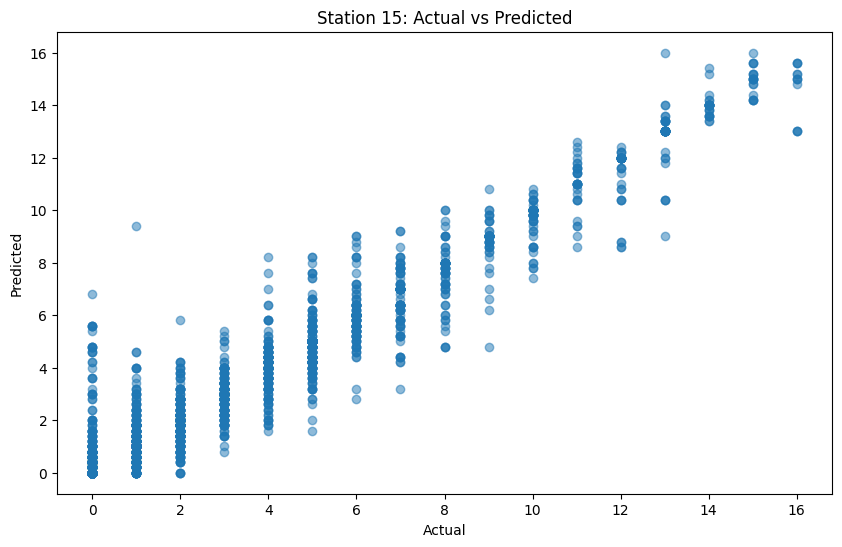

--------------------------------------------------
Number of predictions for station 16: 2725
new R^2 Score: 0.9330158366559361
Accuracy: 0.550091743119266


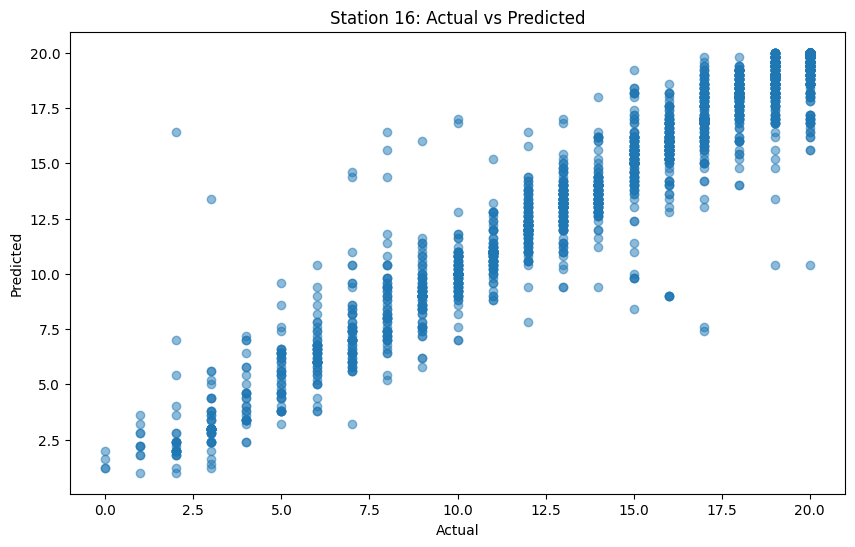

--------------------------------------------------
Number of predictions for station 17: 2605
new R^2 Score: 0.9526872603371854
Accuracy: 0.636852207293666


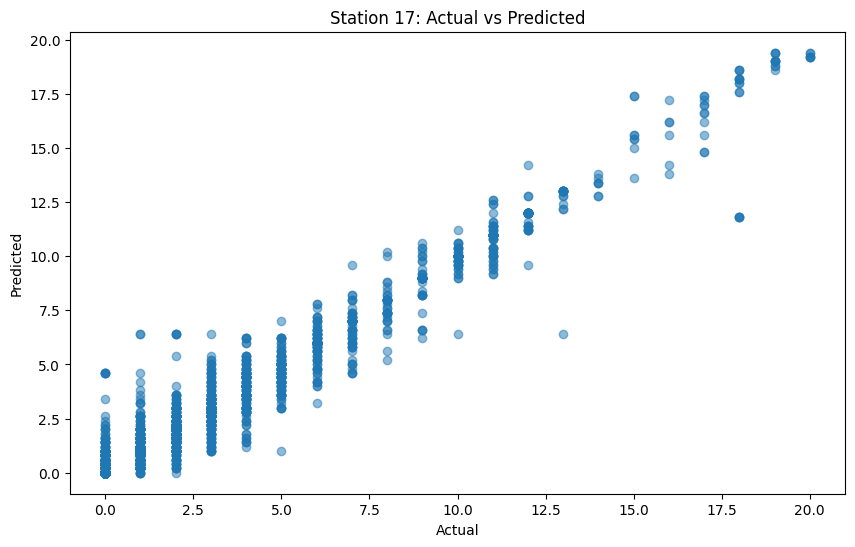

--------------------------------------------------
Number of predictions for station 18: 3015
new R^2 Score: 0.9621569889639365
Accuracy: 0.44477611940298506


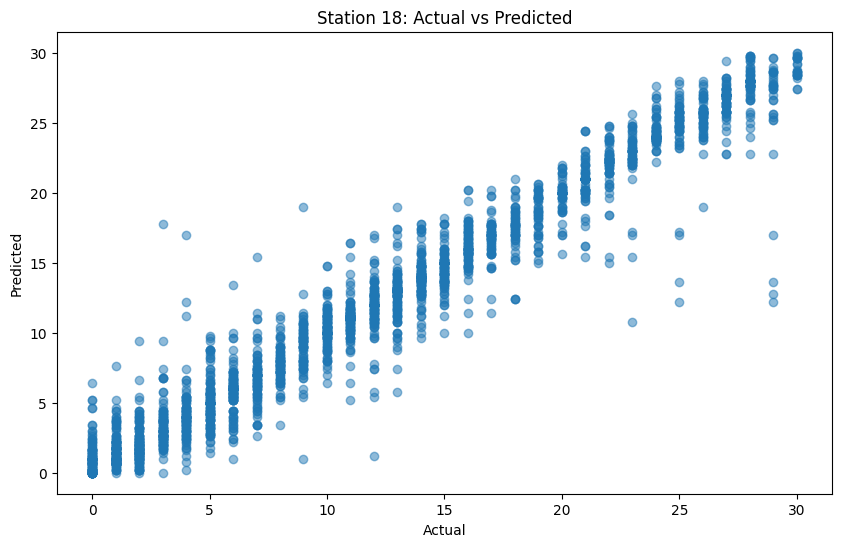

--------------------------------------------------
Number of predictions for station 19: 3096
new R^2 Score: 0.9688479099945939
Accuracy: 0.4166666666666667


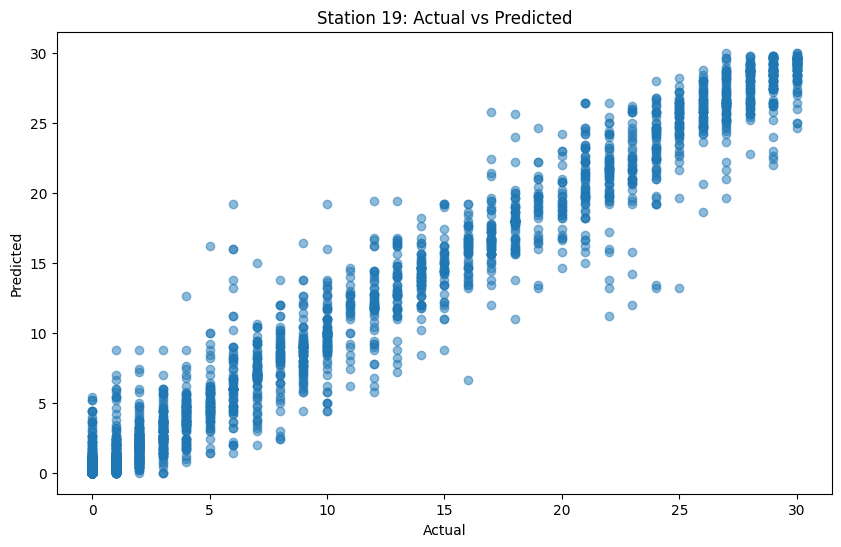

--------------------------------------------------
Number of predictions for station 20: 2712
new R^2 Score: 0.9678828428995825
Accuracy: 0.6017699115044248


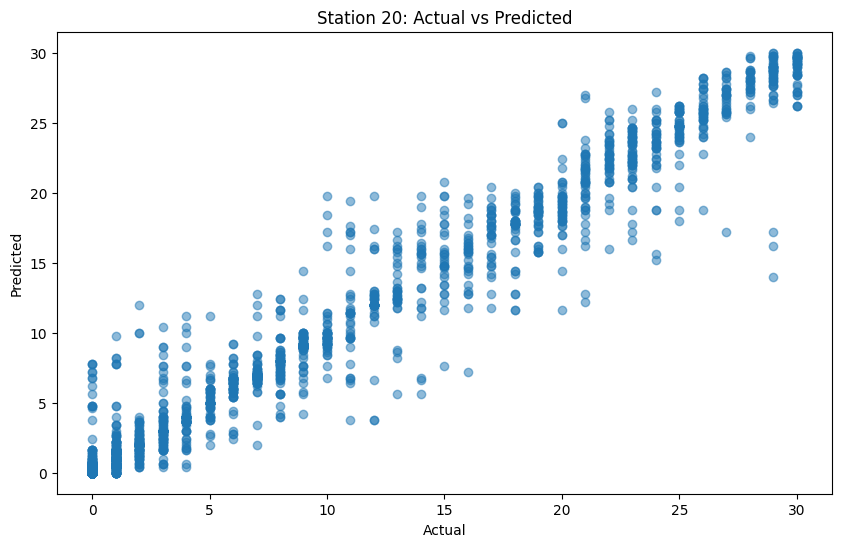

--------------------------------------------------
Number of predictions for station 21: 2901
new R^2 Score: 0.9423052796892061
Accuracy: 0.44881075491209926


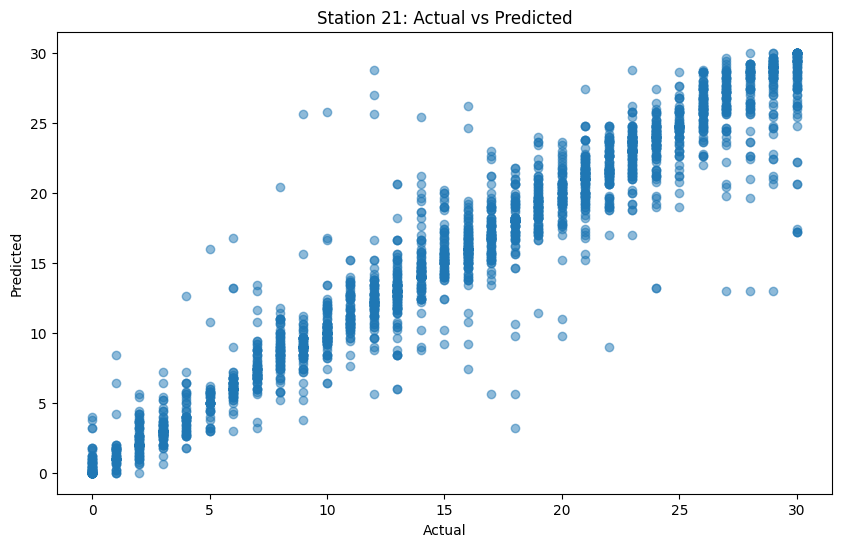

--------------------------------------------------
Number of predictions for station 22: 2928
new R^2 Score: 0.946279544714526
Accuracy: 0.4931693989071038


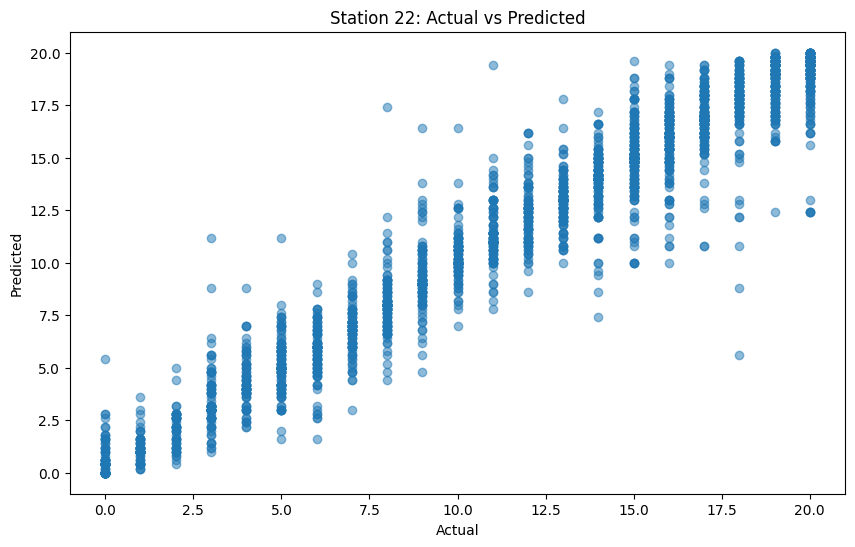

--------------------------------------------------
Number of predictions for station 23: 2942
new R^2 Score: 0.9264932610885205
Accuracy: 0.4833446634942216


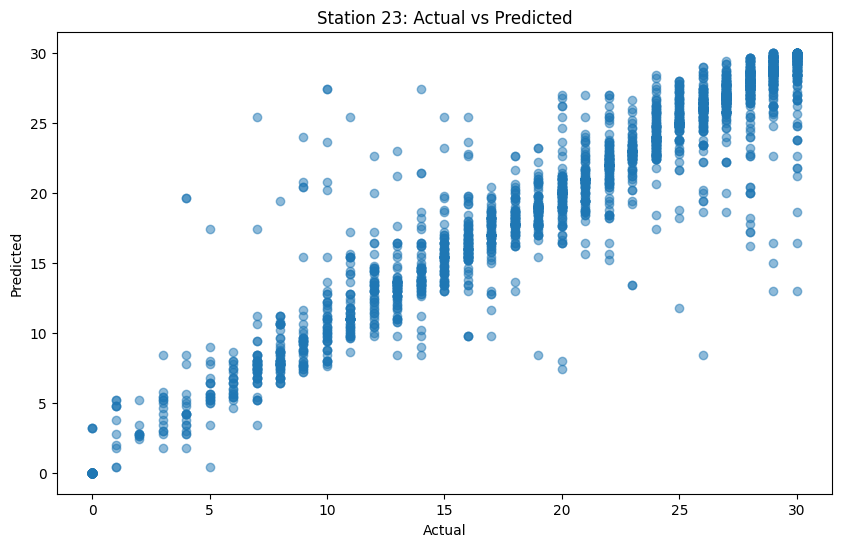

--------------------------------------------------
Number of predictions for station 24: 3046
new R^2 Score: 0.9276096069797292
Accuracy: 0.43007222586999344


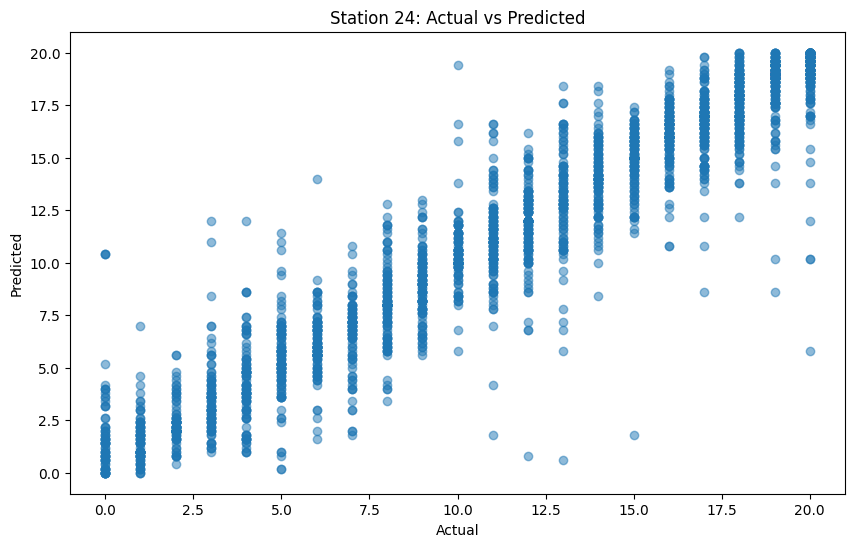

--------------------------------------------------
Number of predictions for station 25: 2667
new R^2 Score: 0.9801126744038072
Accuracy: 0.6475440569928759


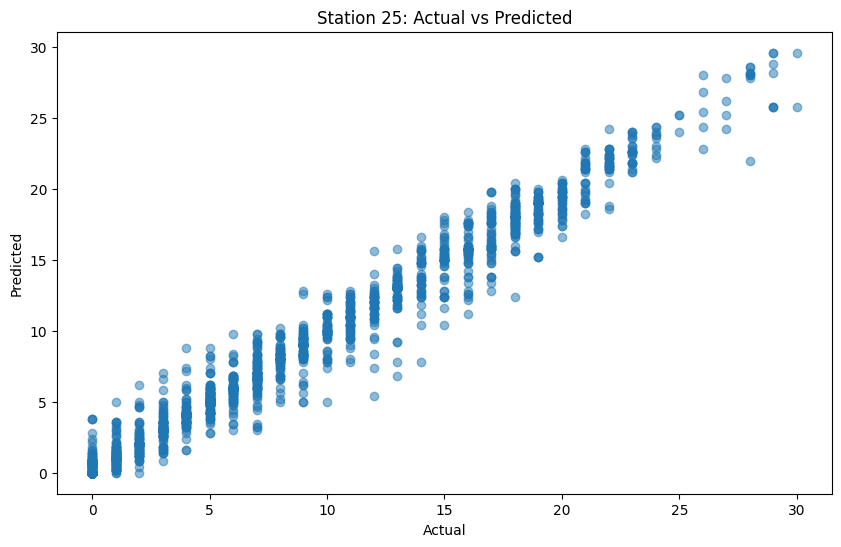

--------------------------------------------------
Number of predictions for station 26: 2727
new R^2 Score: 0.9665874991070702
Accuracy: 0.5401540154015402


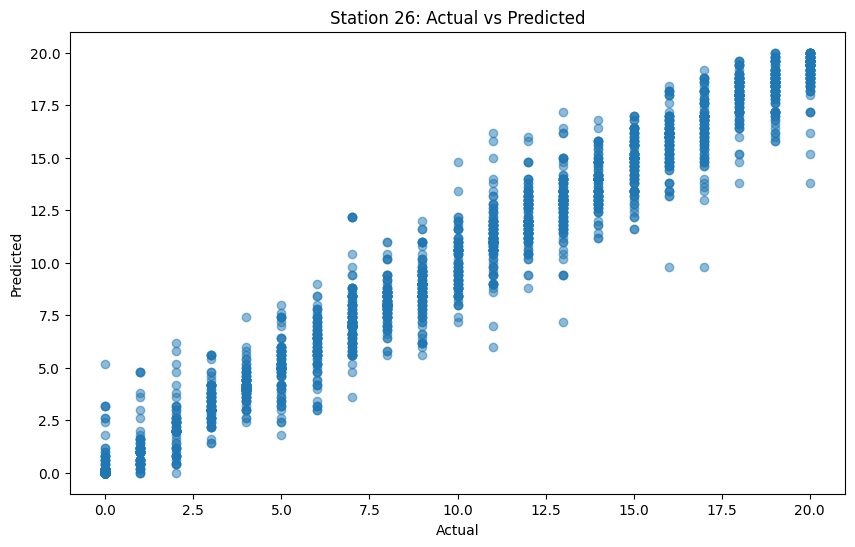

--------------------------------------------------
Number of predictions for station 27: 2846
new R^2 Score: 0.9597291889336899
Accuracy: 0.500351370344343


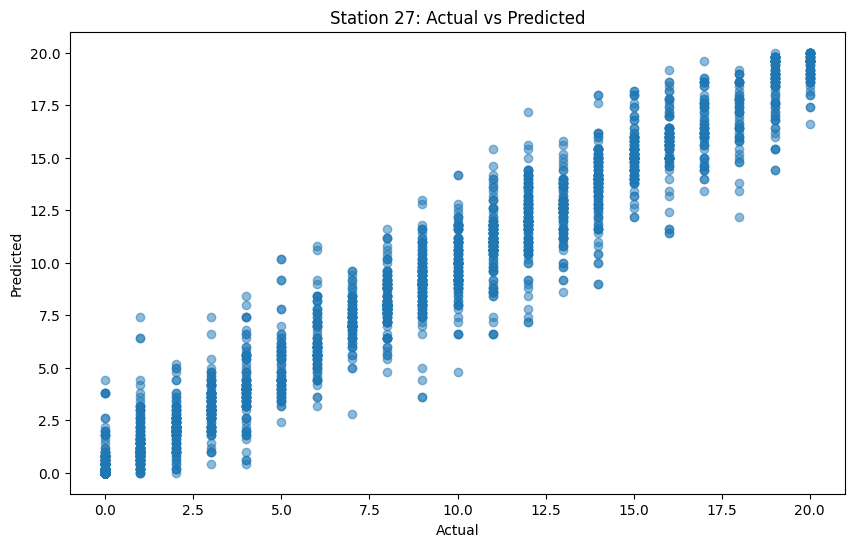

--------------------------------------------------
Number of predictions for station 28: 2786
new R^2 Score: 0.8553196620134889
Accuracy: 0.4849246231155779


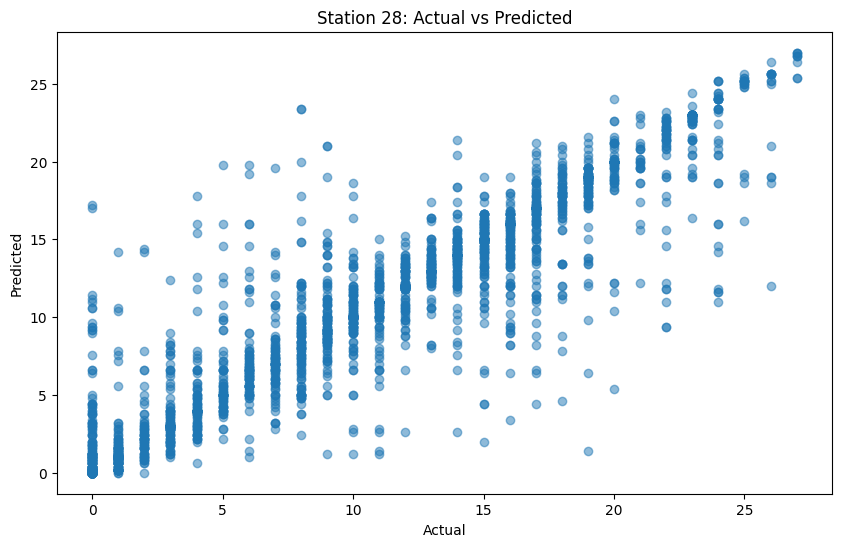

--------------------------------------------------
Number of predictions for station 29: 3004
new R^2 Score: 0.9597376245704897
Accuracy: 0.4543941411451398


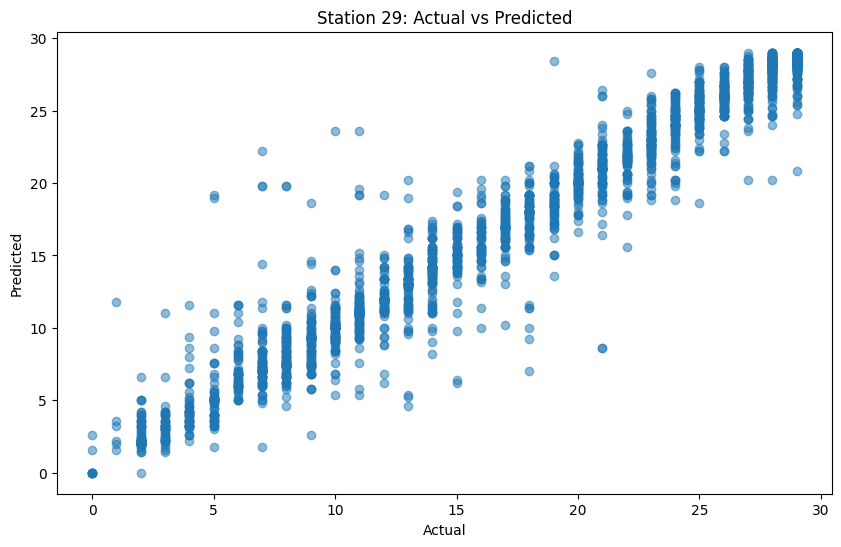

--------------------------------------------------
Number of predictions for station 30: 2543
new R^2 Score: 0.9564065629390156
Accuracy: 0.6920959496657492


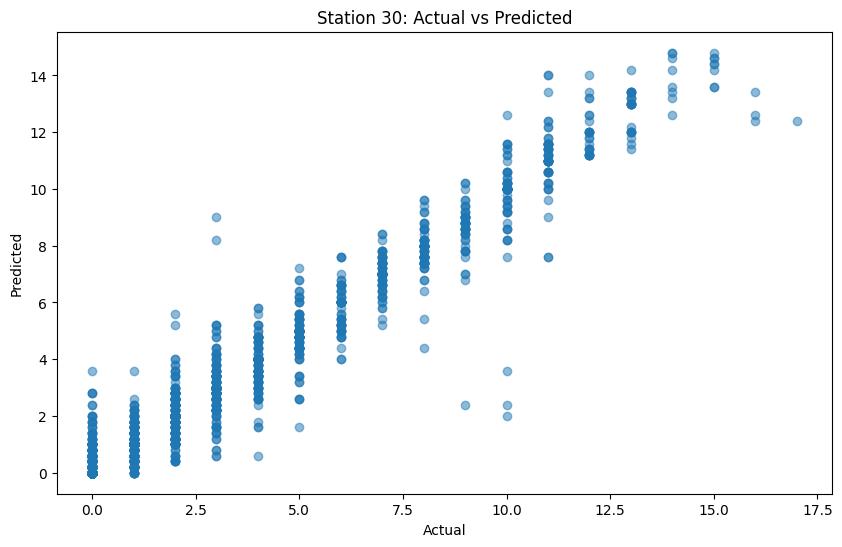

--------------------------------------------------
Number of predictions for station 31: 2940
new R^2 Score: 0.898490048273955
Accuracy: 0.4493197278911565


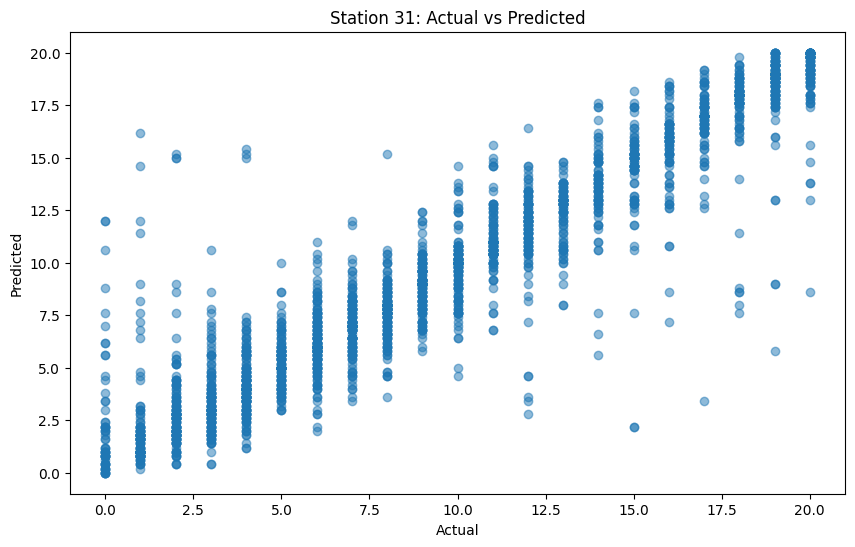

--------------------------------------------------
Number of predictions for station 32: 3031
new R^2 Score: 0.9299657353337863
Accuracy: 0.4331903662157704


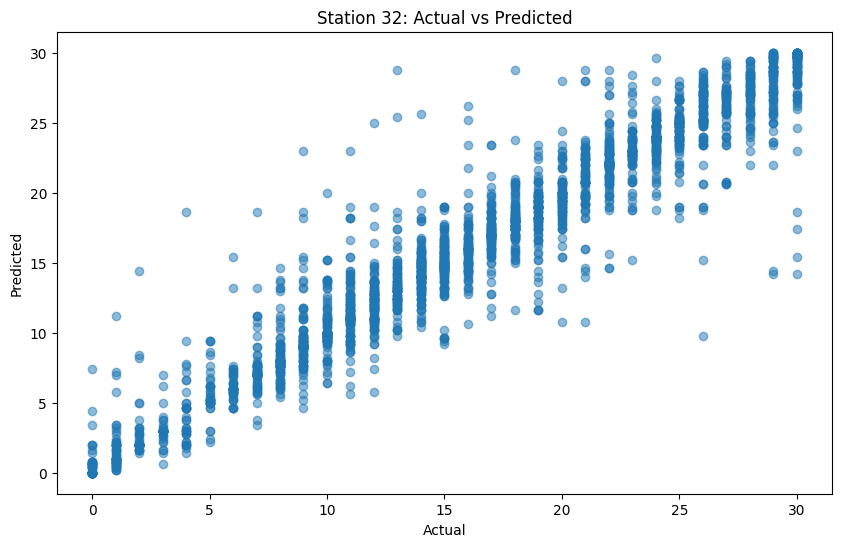

--------------------------------------------------
Number of predictions for station 33: 3227
new R^2 Score: 0.787743772248757
Accuracy: 0.37062286953827084


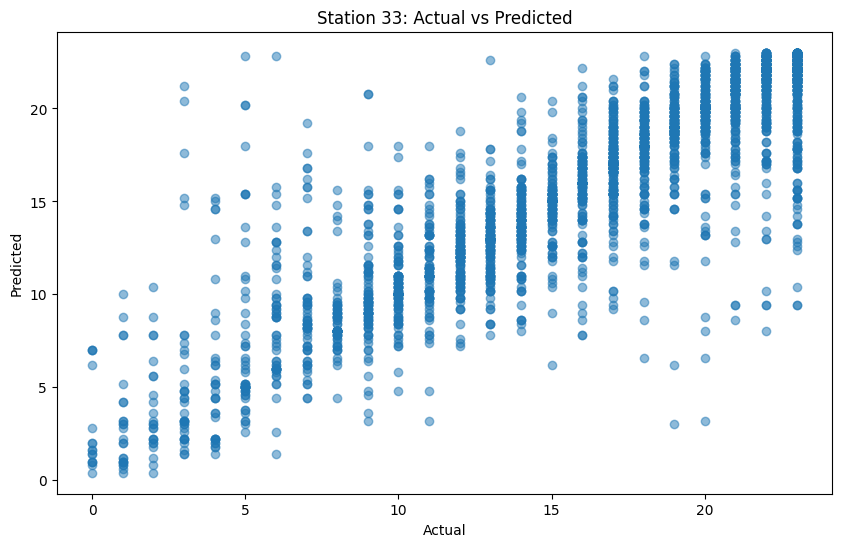

--------------------------------------------------
Number of predictions for station 34: 3122
new R^2 Score: 0.9243318188556428
Accuracy: 0.3725176169122357


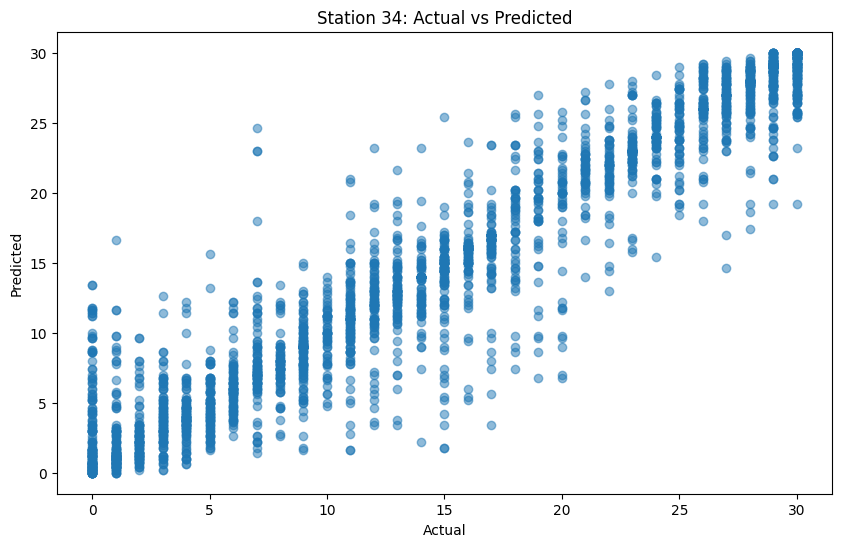

--------------------------------------------------
Number of predictions for station 35: 3002
new R^2 Score: 0.9809550099275555
Accuracy: 0.4603597601598934


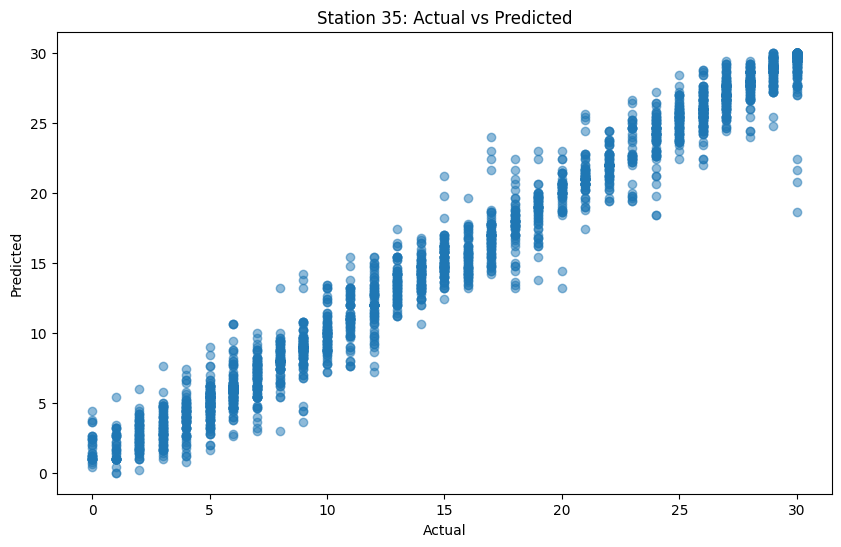

--------------------------------------------------
Number of predictions for station 36: 2777
new R^2 Score: 0.9697266843941394
Accuracy: 0.5660785019805545


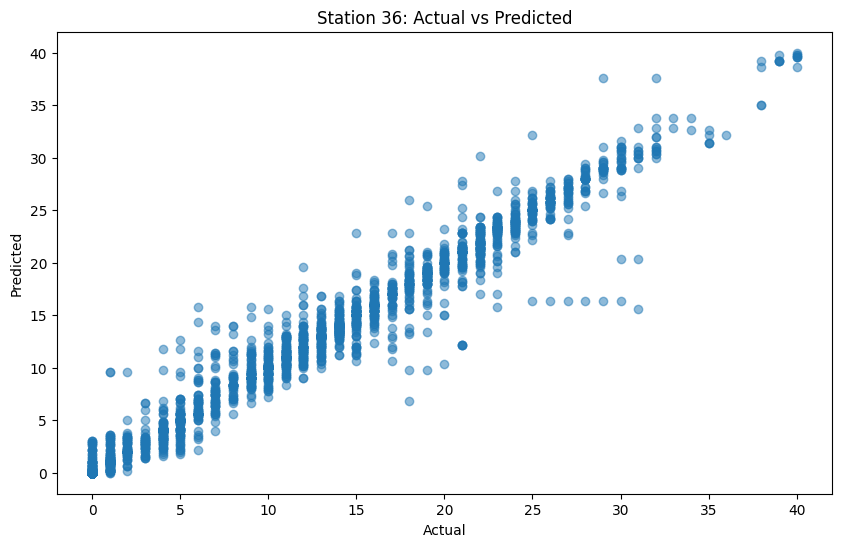

--------------------------------------------------
Number of predictions for station 37: 2476
new R^2 Score: 0.9745689036117304
Accuracy: 0.7536348949919225


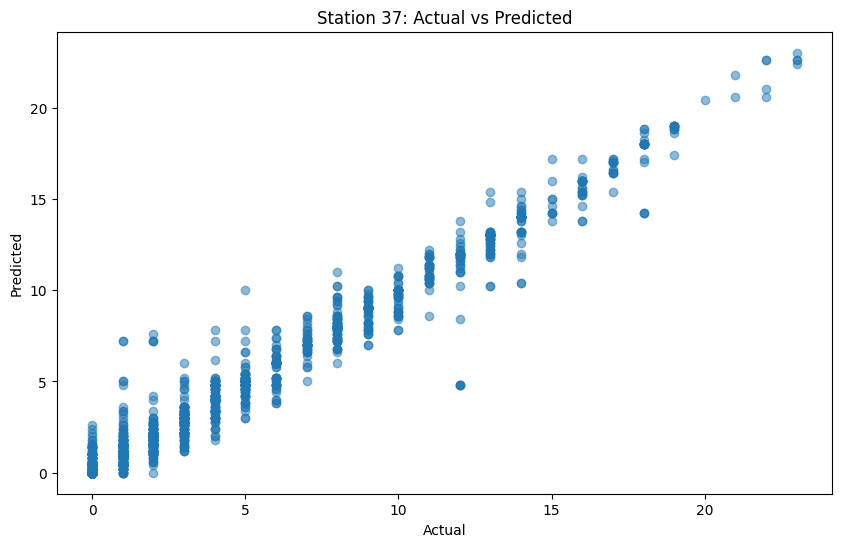

--------------------------------------------------
Number of predictions for station 38: 3125
new R^2 Score: 0.9703548666827585
Accuracy: 0.4672


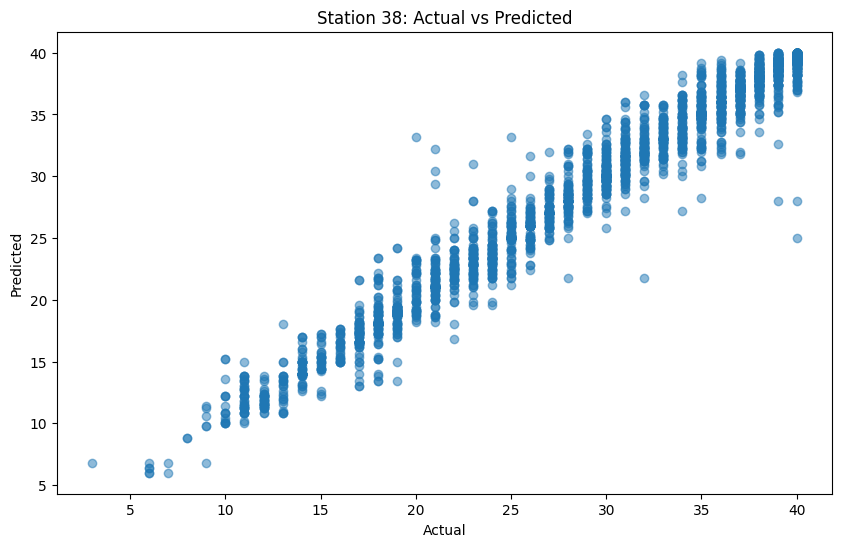

--------------------------------------------------
Number of predictions for station 39: 3029
new R^2 Score: 0.9056045039821501
Accuracy: 0.45625619016176955


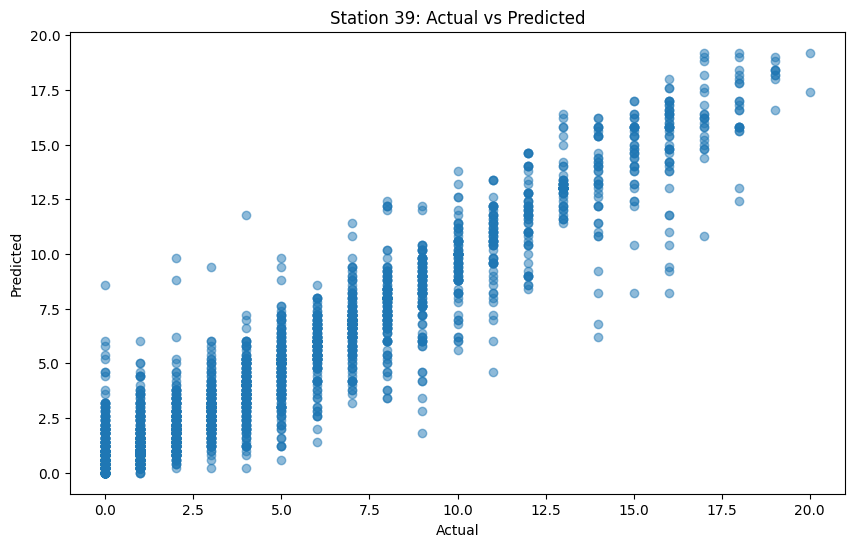

--------------------------------------------------
Number of predictions for station 40: 2933
new R^2 Score: 0.9420790795411329
Accuracy: 0.4885782475281282


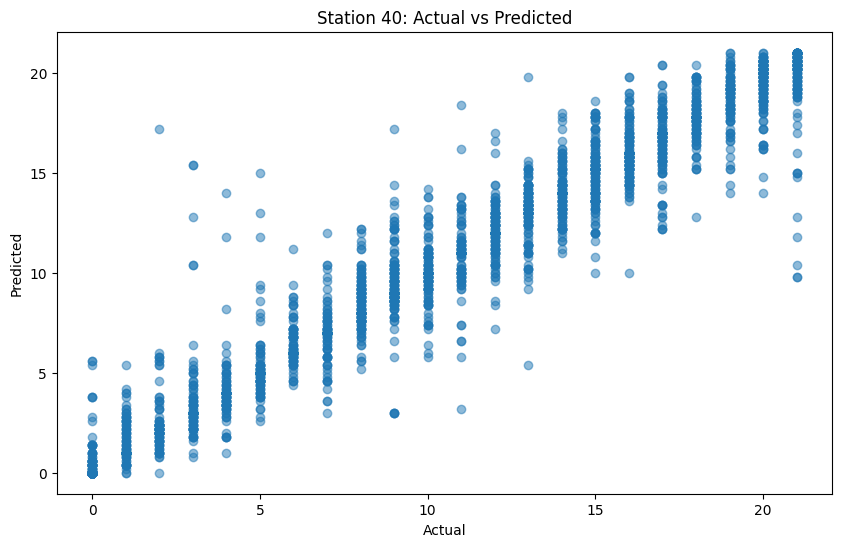

--------------------------------------------------
Number of predictions for station 41: 2602
new R^2 Score: 0.9489564374401788
Accuracy: 0.6464258262874711


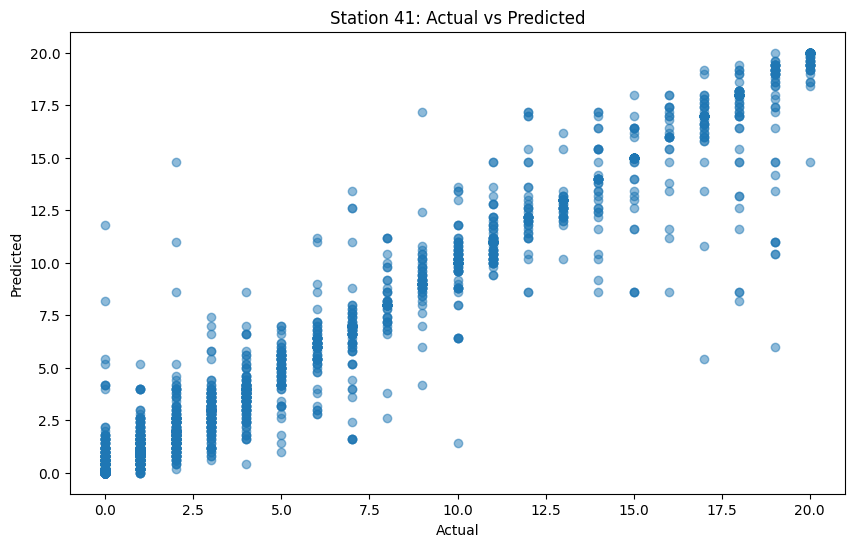

--------------------------------------------------
Number of predictions for station 42: 2897
new R^2 Score: 0.9752369920802931
Accuracy: 0.4929237141870901


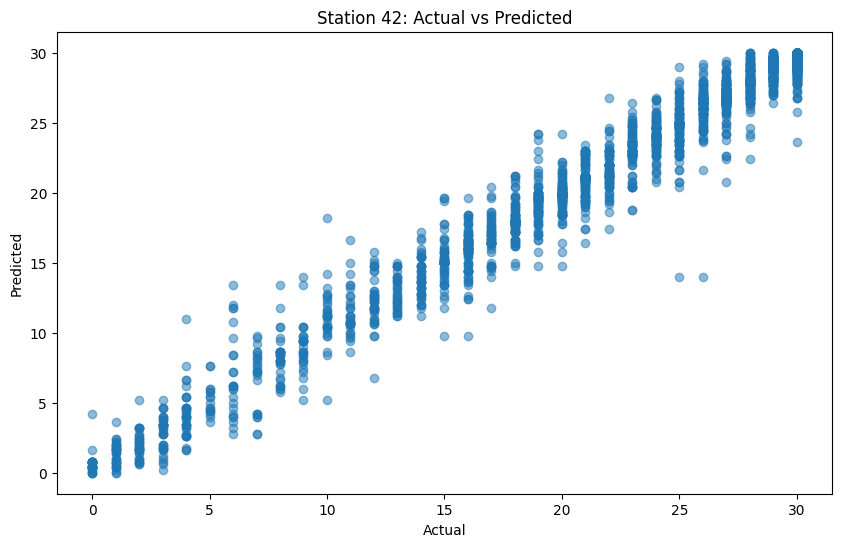

--------------------------------------------------
Number of predictions for station 43: 2851
new R^2 Score: 0.9535147485423202
Accuracy: 0.4650999649245879


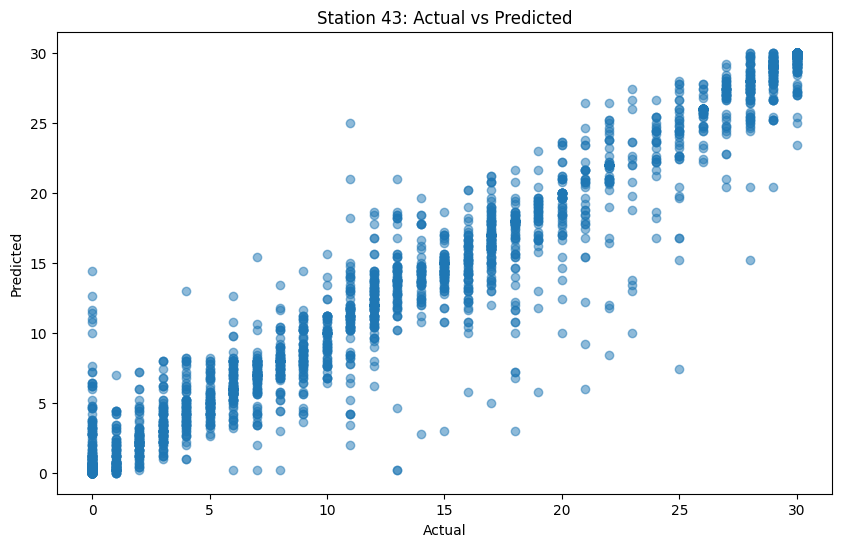

--------------------------------------------------
Number of predictions for station 44: 2763
new R^2 Score: 0.9726672452015613
Accuracy: 0.5117625769091567


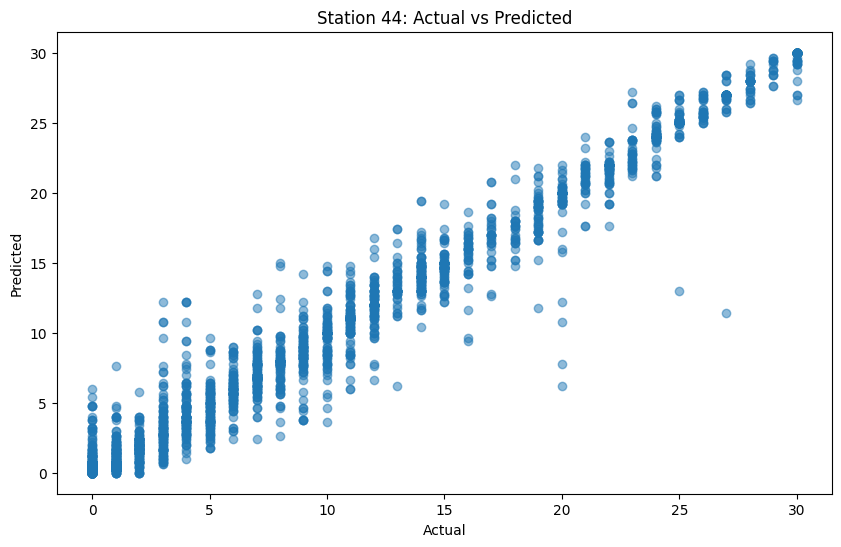

--------------------------------------------------
Number of predictions for station 45: 2769
new R^2 Score: 0.9654024815484888
Accuracy: 0.584687612856627


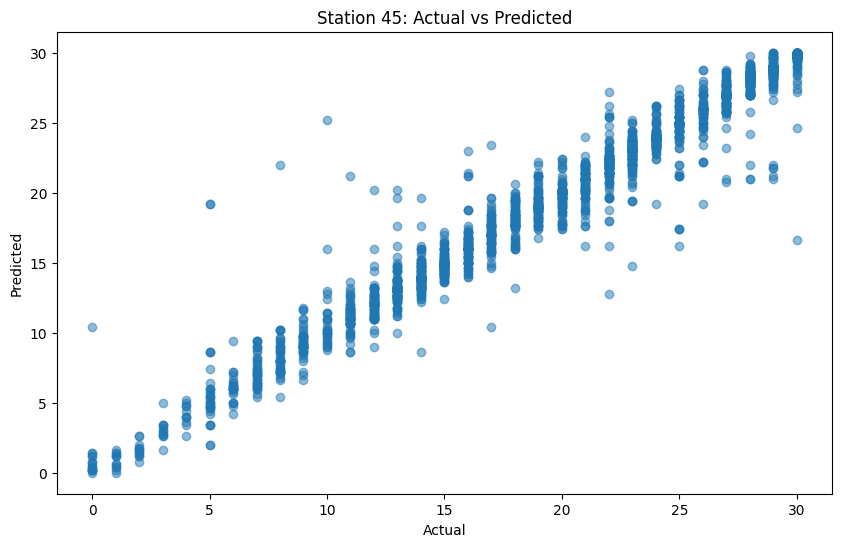

--------------------------------------------------
Number of predictions for station 47: 2584
new R^2 Score: 0.9704571115606188
Accuracy: 0.6787925696594427


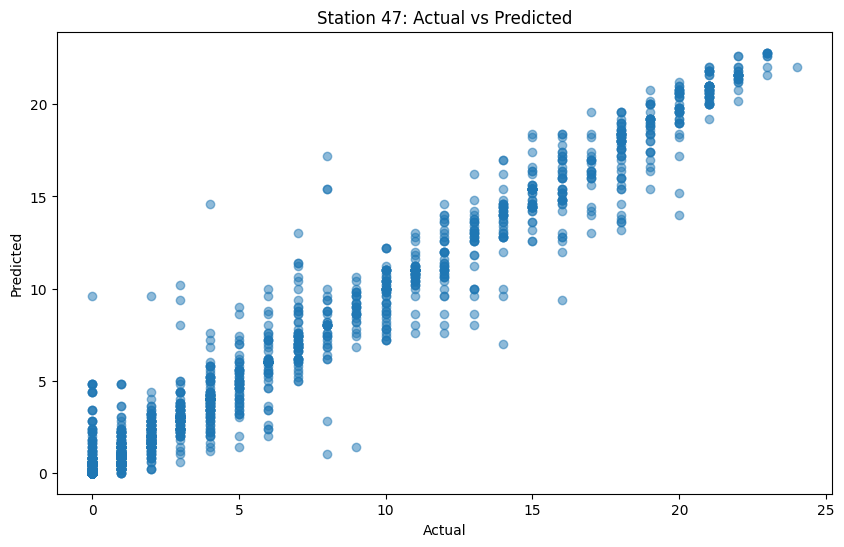

--------------------------------------------------
Number of predictions for station 48: 2816
new R^2 Score: 0.9809426727671343
Accuracy: 0.5376420454545454


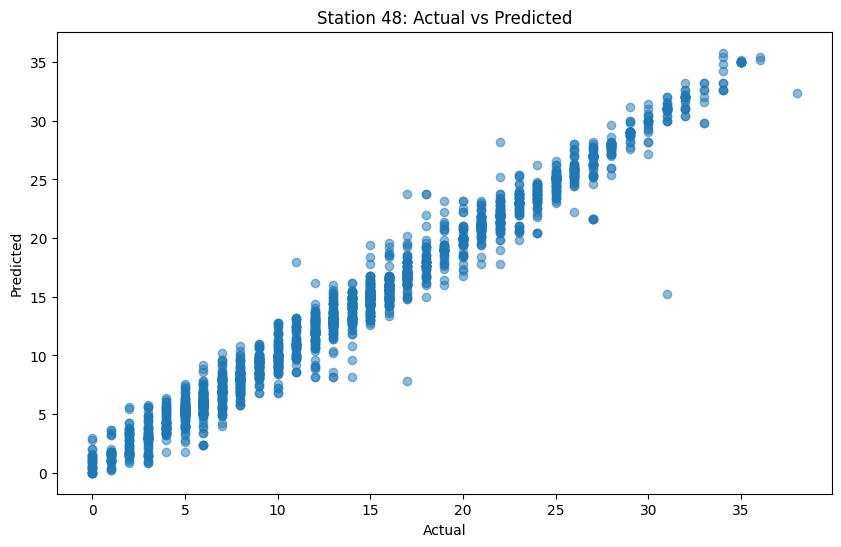

--------------------------------------------------
Number of predictions for station 49: 3057
new R^2 Score: 0.9691785369884812
Accuracy: 0.41609421000981356


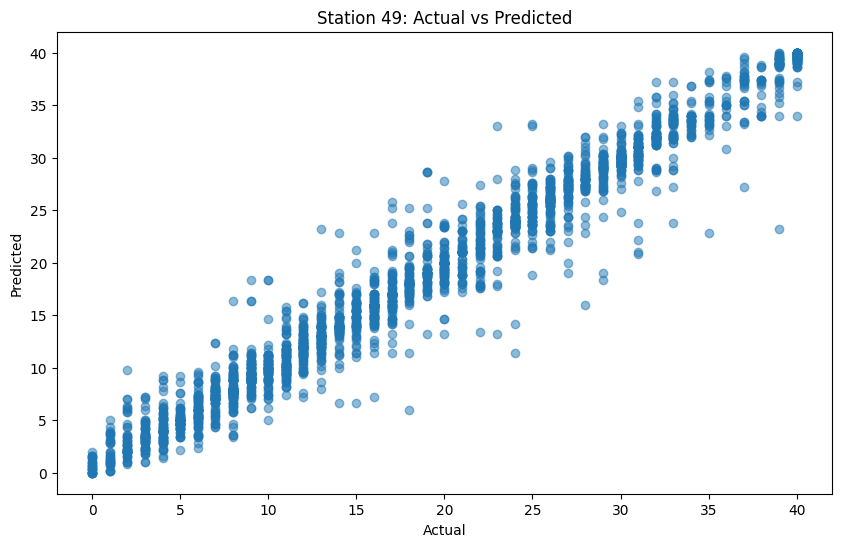

--------------------------------------------------
Number of predictions for station 50: 2998
new R^2 Score: 0.9792717845328239
Accuracy: 0.4492995330220147


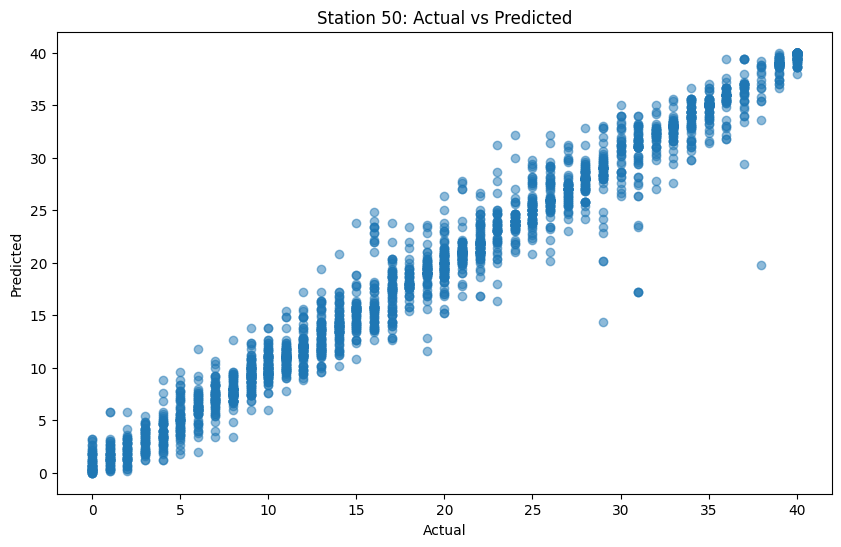

--------------------------------------------------
Number of predictions for station 51: 2581
new R^2 Score: 0.9848331481661156
Accuracy: 0.6691204959318093


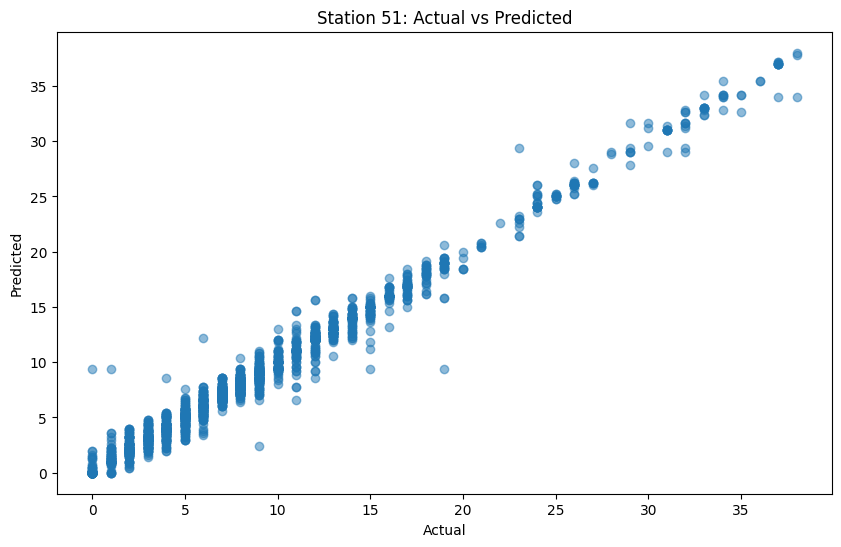

--------------------------------------------------
Number of predictions for station 52: 2615
new R^2 Score: 0.977036683757657
Accuracy: 0.5652007648183557


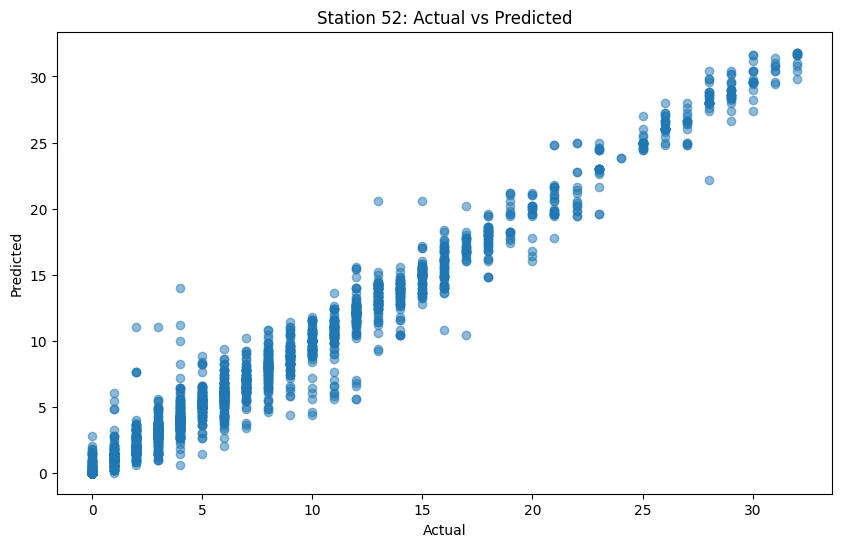

--------------------------------------------------
Number of predictions for station 53: 2491
new R^2 Score: 0.9676860508571814
Accuracy: 0.7607386591730229


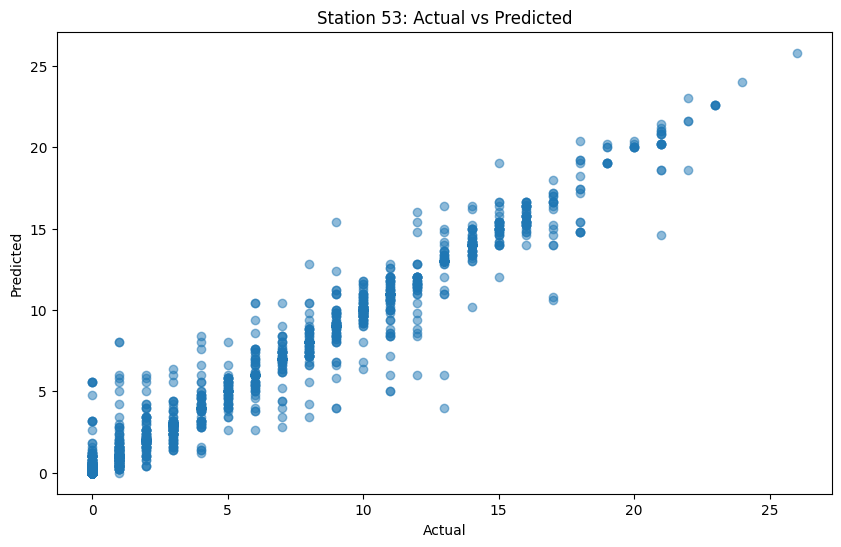

--------------------------------------------------
Number of predictions for station 54: 2645
new R^2 Score: 0.9824322659041823
Accuracy: 0.631758034026465


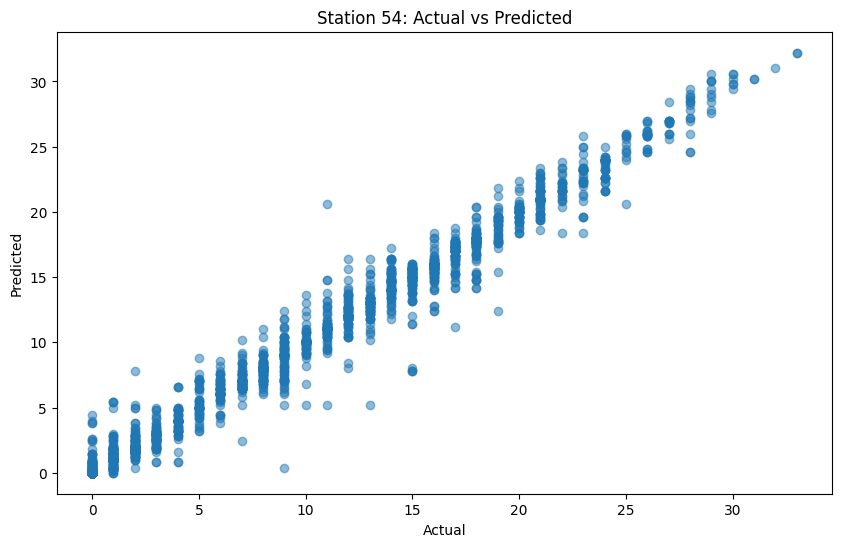

--------------------------------------------------
Number of predictions for station 55: 2623
new R^2 Score: 0.9685799134891528
Accuracy: 0.6675562333206252


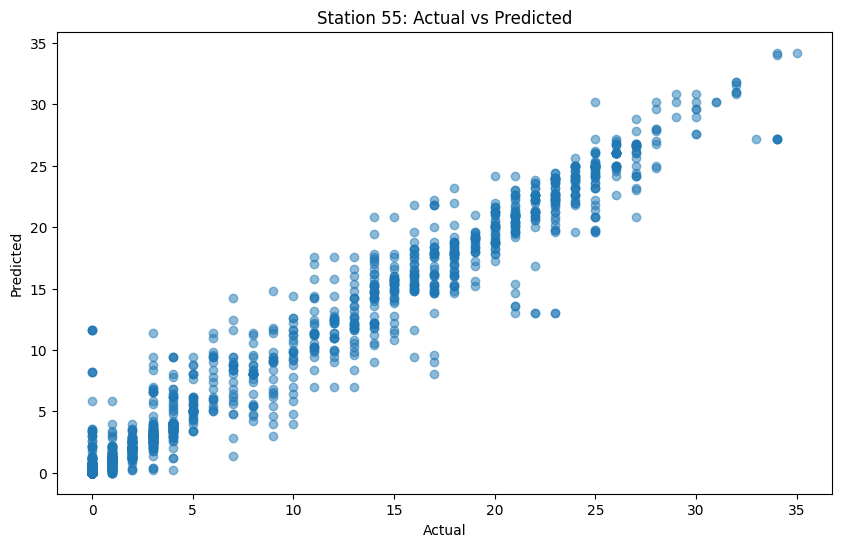

--------------------------------------------------
Number of predictions for station 56: 2951
new R^2 Score: 0.96666372122084
Accuracy: 0.4347678752965097


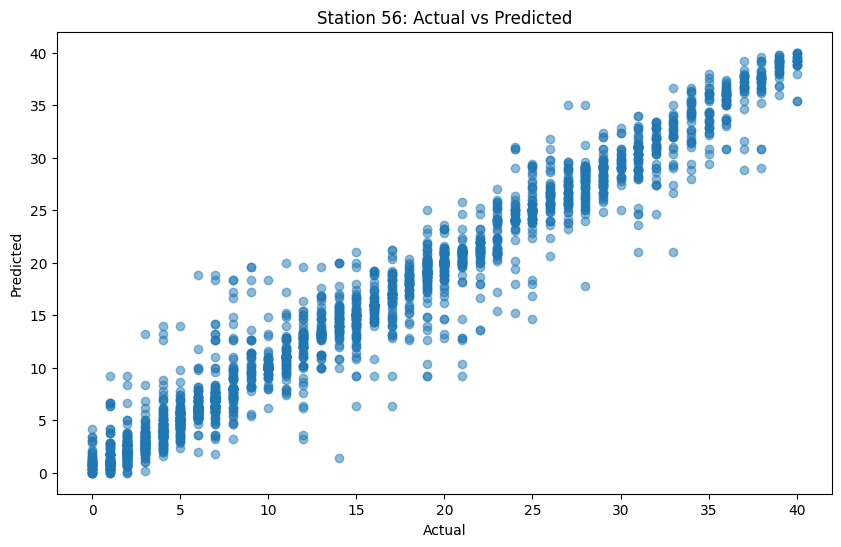

--------------------------------------------------
Number of predictions for station 57: 2599
new R^2 Score: 0.9742811432871632
Accuracy: 0.6383224317045018


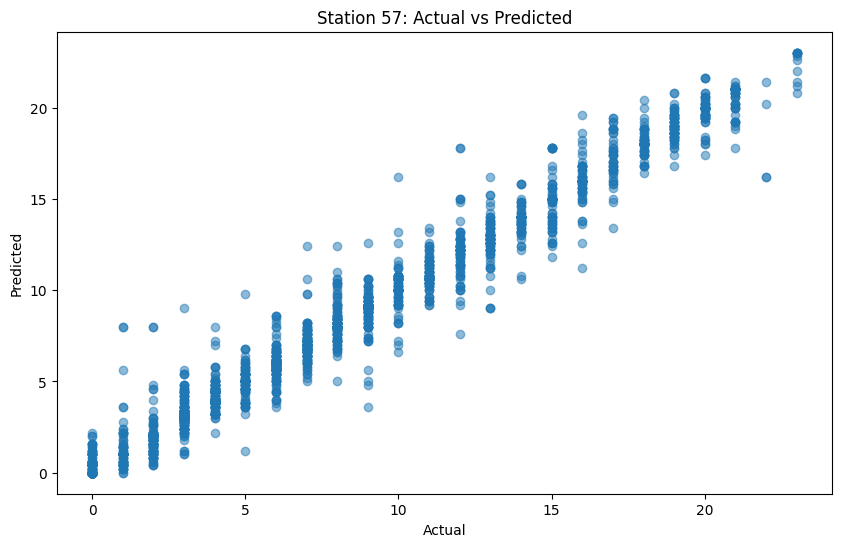

--------------------------------------------------
Number of predictions for station 58: 3126
new R^2 Score: 0.9490551257836044
Accuracy: 0.3877159309021113


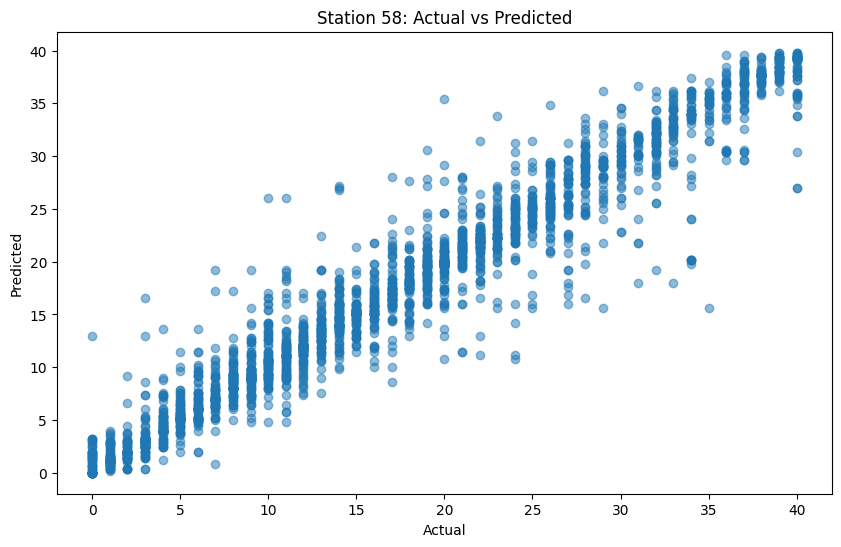

--------------------------------------------------
Number of predictions for station 59: 2622
new R^2 Score: 0.9372695719126339
Accuracy: 0.6422578184591915


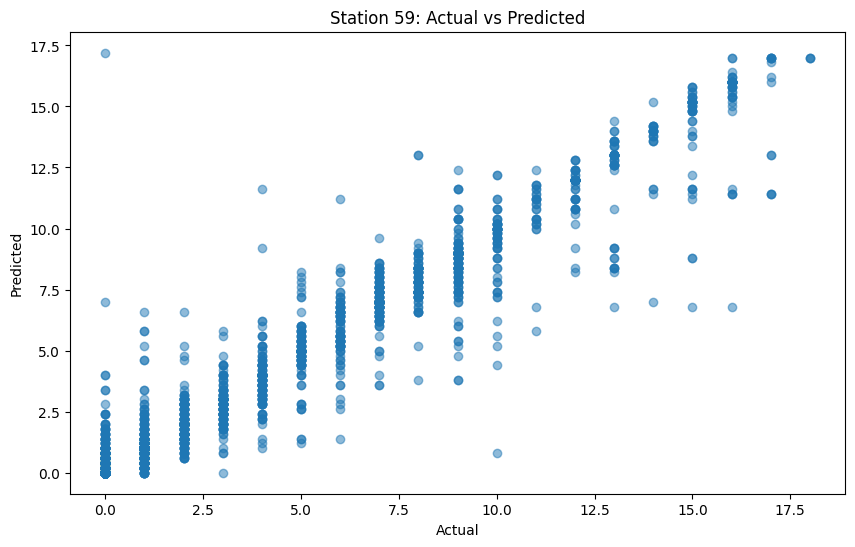

--------------------------------------------------
Number of predictions for station 60: 3001
new R^2 Score: 0.9573667116203992
Accuracy: 0.42285904698433857


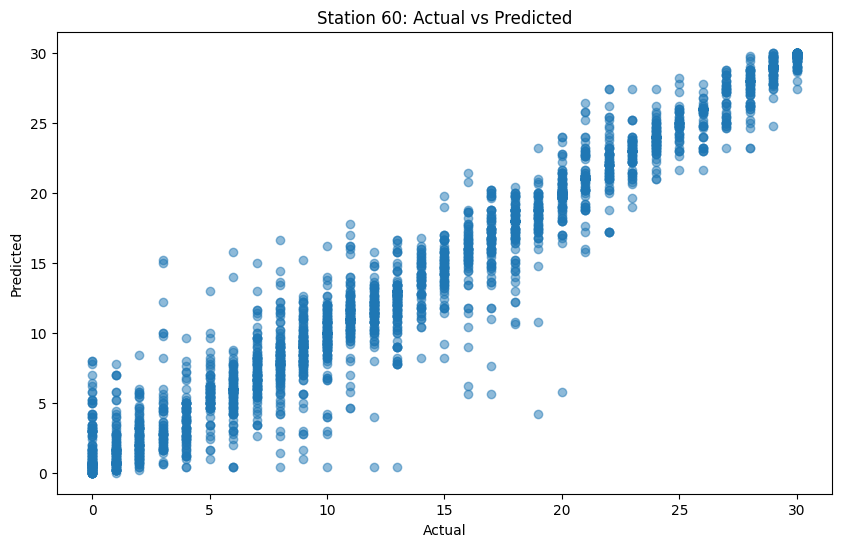

--------------------------------------------------
Number of predictions for station 61: 2518
new R^2 Score: 0.9617870724254751
Accuracy: 0.7009531374106434


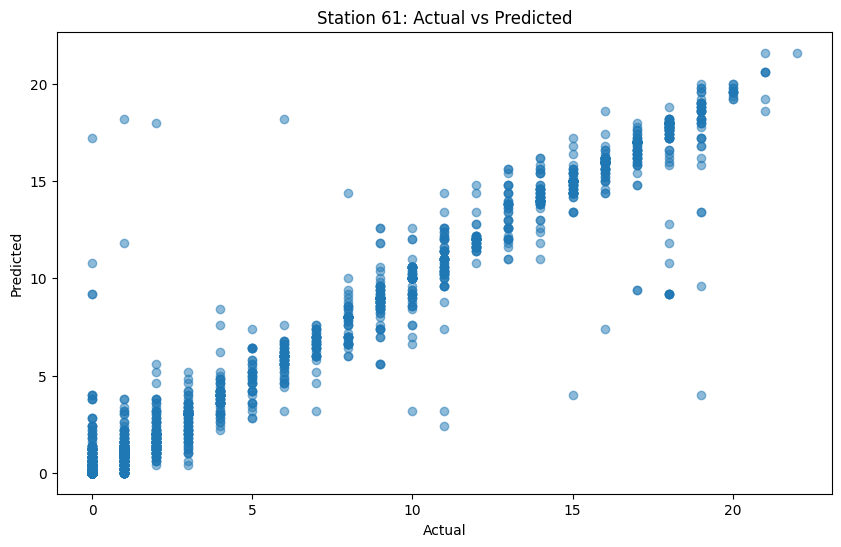

--------------------------------------------------
Number of predictions for station 62: 2853
new R^2 Score: 0.9780032951434228
Accuracy: 0.5036803364879074


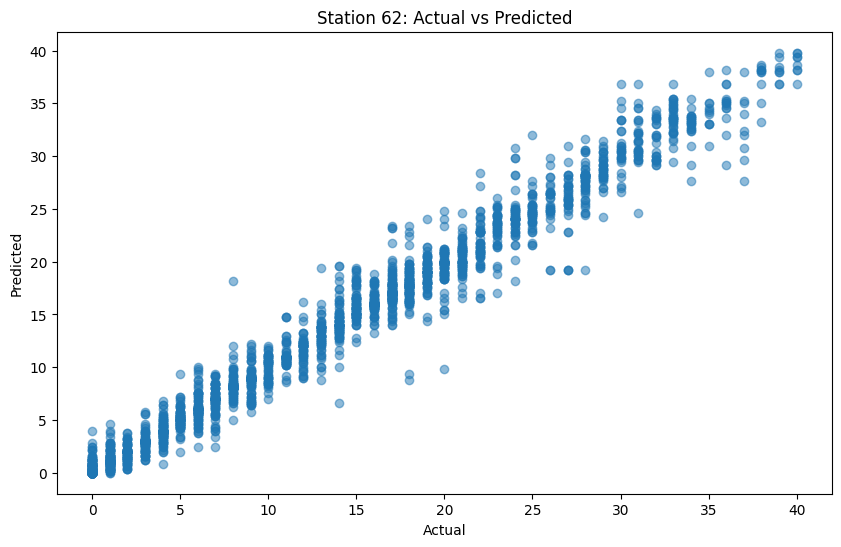

--------------------------------------------------
Number of predictions for station 63: 2760
new R^2 Score: 0.9725880983610737
Accuracy: 0.5547101449275362


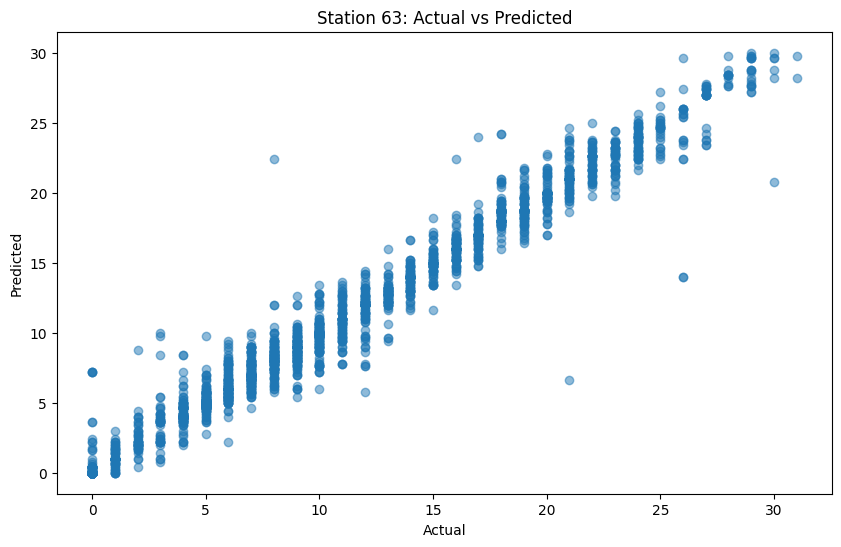

--------------------------------------------------
Number of predictions for station 64: 2950
new R^2 Score: 0.950535122580435
Accuracy: 0.5003389830508475


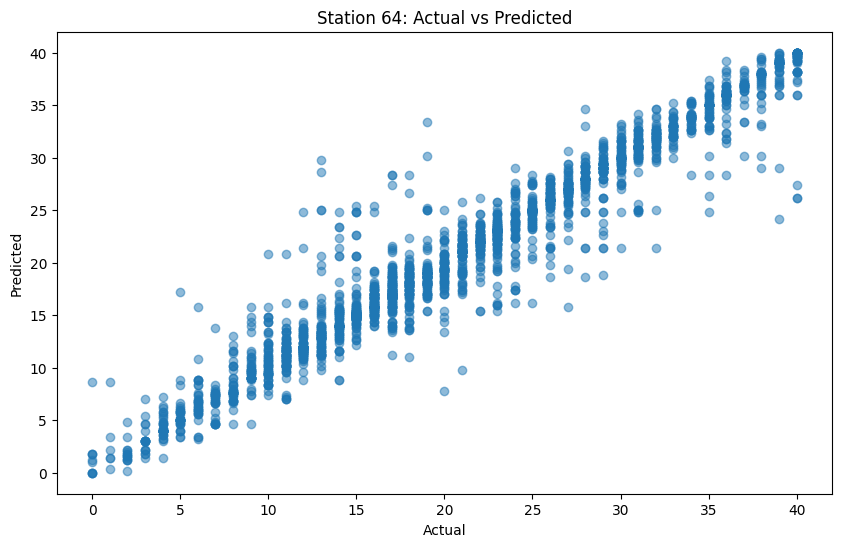

--------------------------------------------------
Number of predictions for station 65: 2542
new R^2 Score: 0.9498421145295706
Accuracy: 0.5216365066876475


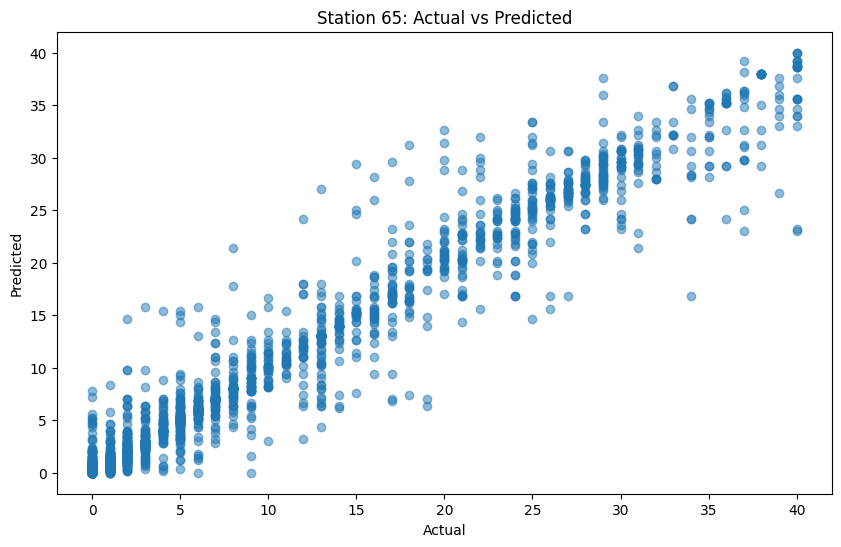

--------------------------------------------------
Number of predictions for station 66: 2850
new R^2 Score: 0.944611022930645
Accuracy: 0.41578947368421054


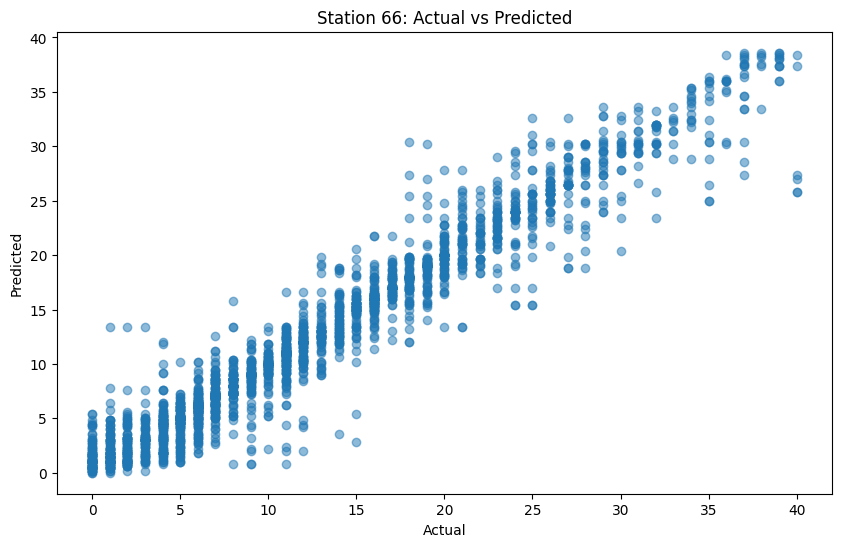

--------------------------------------------------
Number of predictions for station 67: 3051
new R^2 Score: 0.9627597246594544
Accuracy: 0.41822353326778106


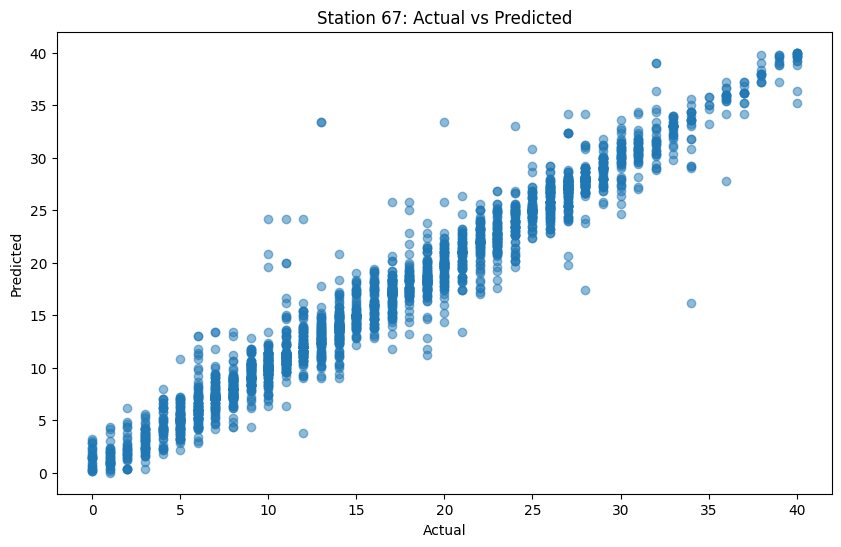

--------------------------------------------------
Number of predictions for station 68: 3045
new R^2 Score: 0.9694242750425813
Accuracy: 0.42167487684729066


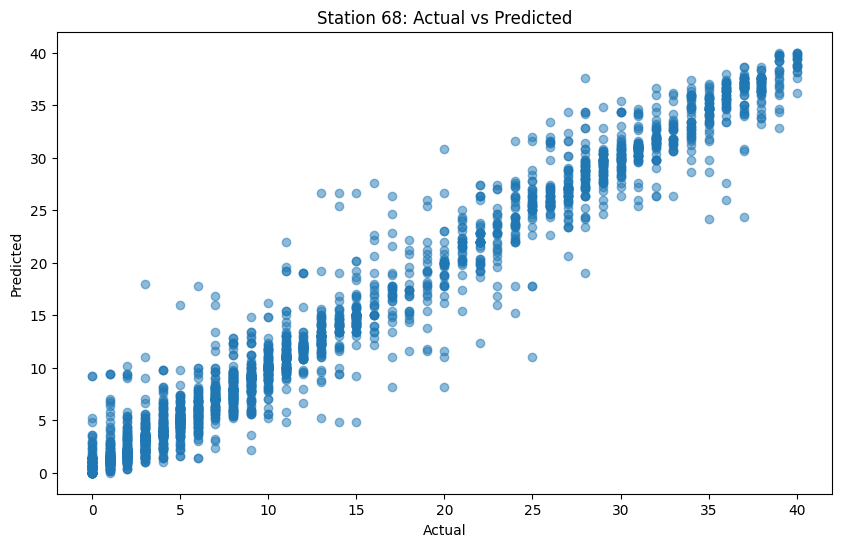

--------------------------------------------------
Number of predictions for station 69: 3367
new R^2 Score: 0.9612057046252221
Accuracy: 0.35372735372735375


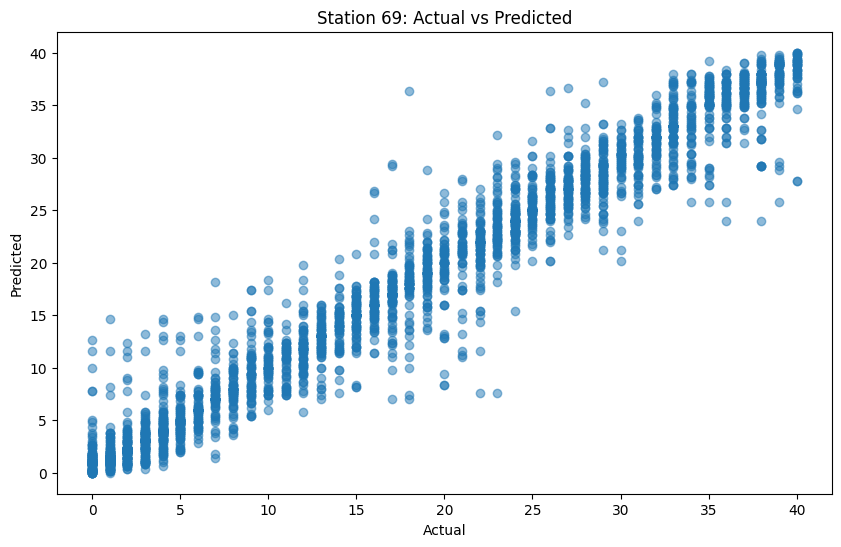

--------------------------------------------------
Number of predictions for station 71: 2735
new R^2 Score: 0.9615792999275509
Accuracy: 0.540036563071298


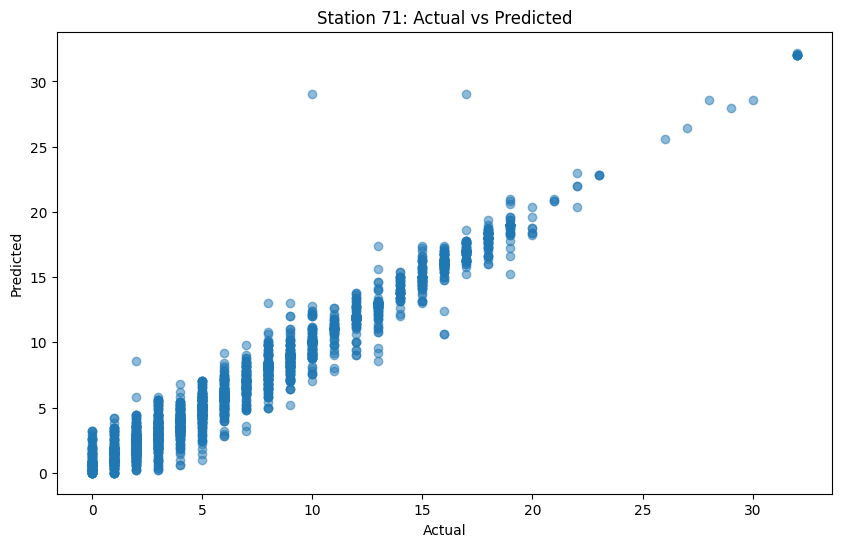

--------------------------------------------------
Number of predictions for station 72: 2730
new R^2 Score: 0.9256789169264305
Accuracy: 0.5384615384615384


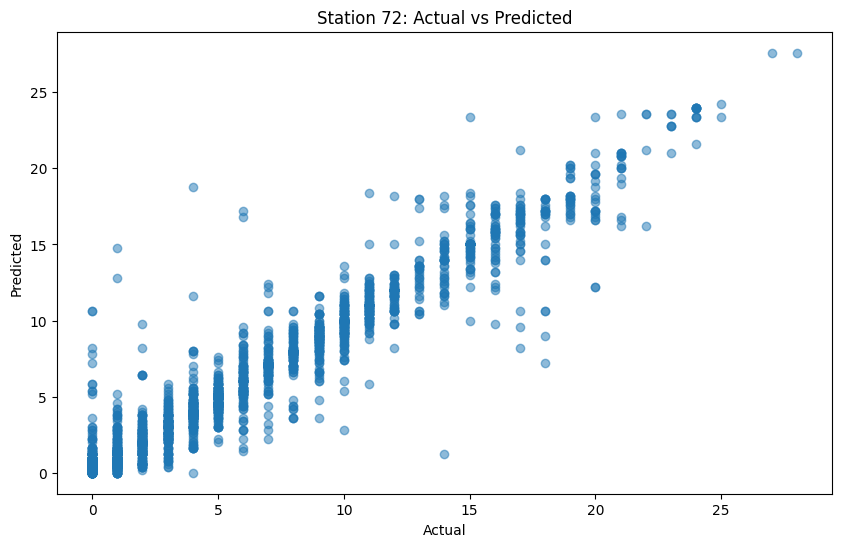

--------------------------------------------------
Number of predictions for station 73: 2843
new R^2 Score: 0.9430032278094876
Accuracy: 0.481885332395357


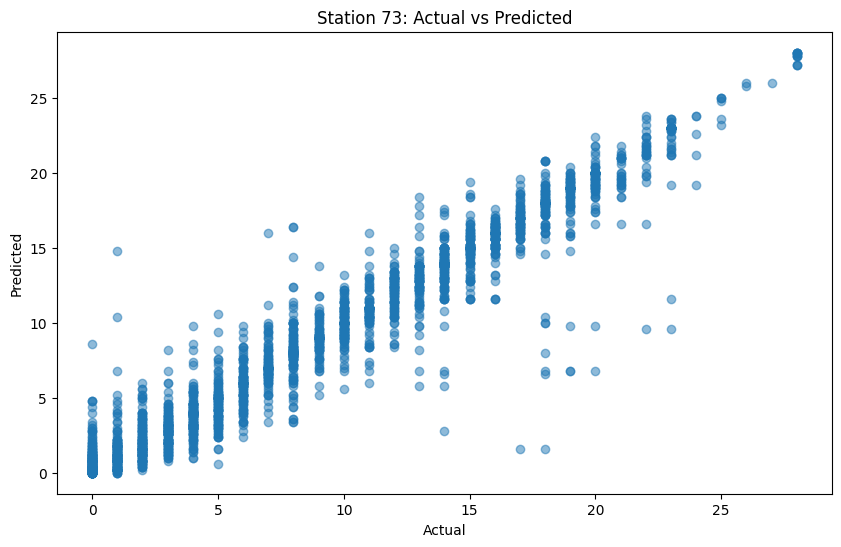

--------------------------------------------------
Number of predictions for station 74: 2732
new R^2 Score: 0.9698669923931899
Accuracy: 0.5541727672035139


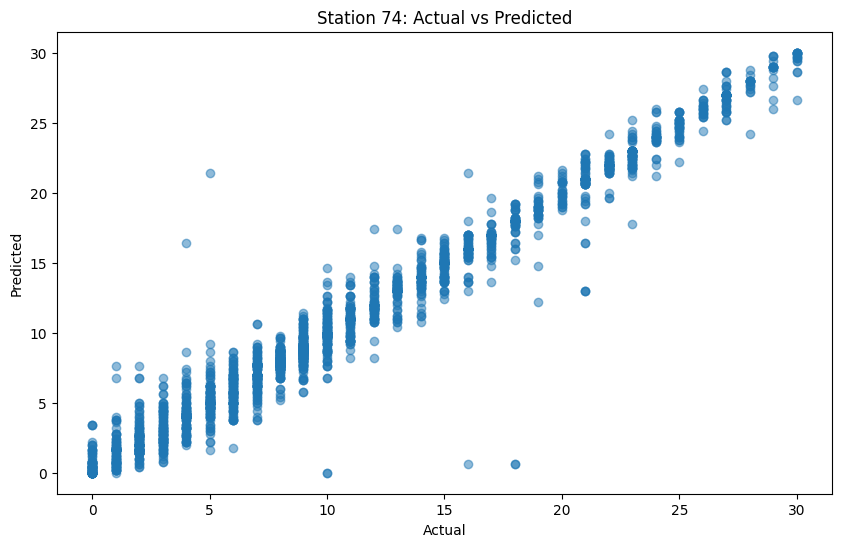

--------------------------------------------------
Number of predictions for station 75: 2778
new R^2 Score: 0.9658152571099972
Accuracy: 0.583873290136789


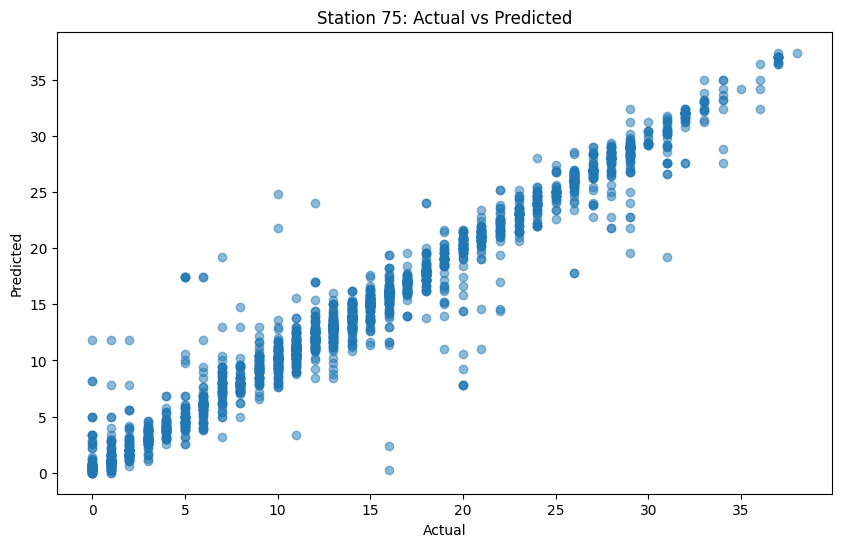

--------------------------------------------------
Number of predictions for station 76: 2600
new R^2 Score: 0.9428010761099327
Accuracy: 0.5980769230769231


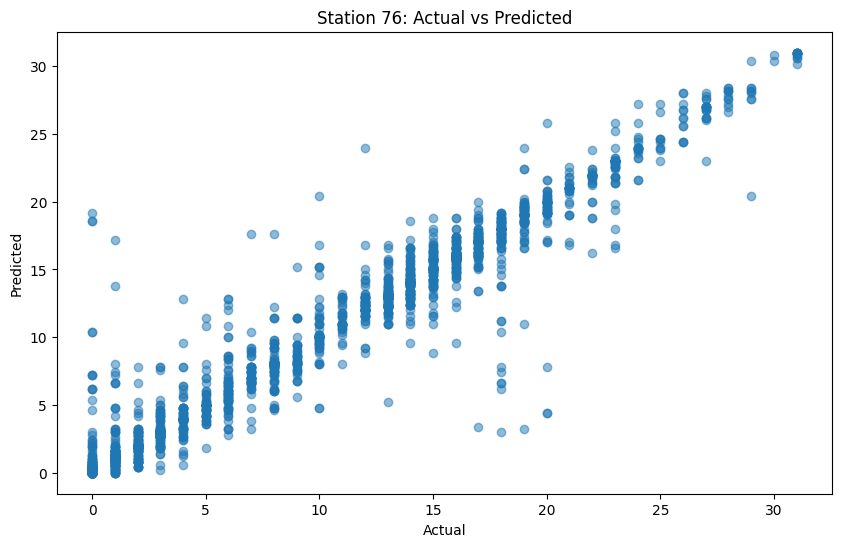

--------------------------------------------------
Number of predictions for station 77: 2856
new R^2 Score: 0.9788606154535947
Accuracy: 0.5063025210084033


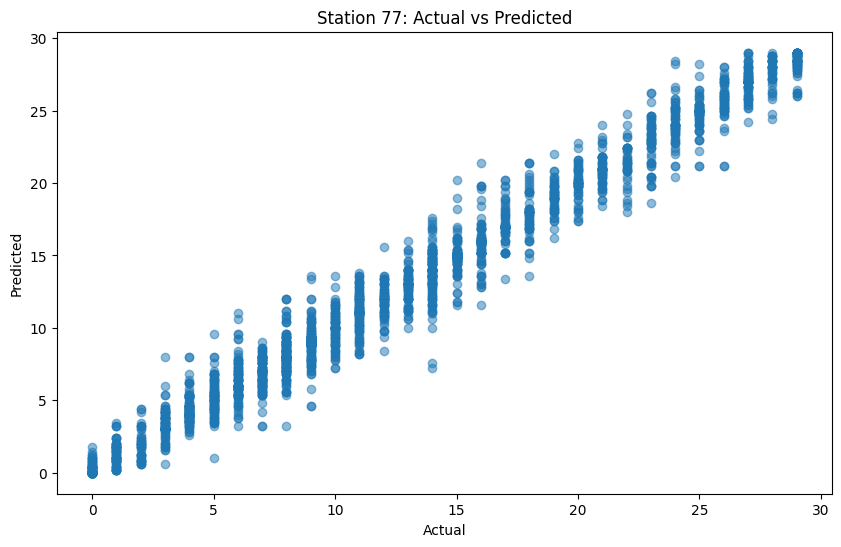

--------------------------------------------------
Number of predictions for station 78: 2705
new R^2 Score: 0.9718142636128985
Accuracy: 0.5619223659889094


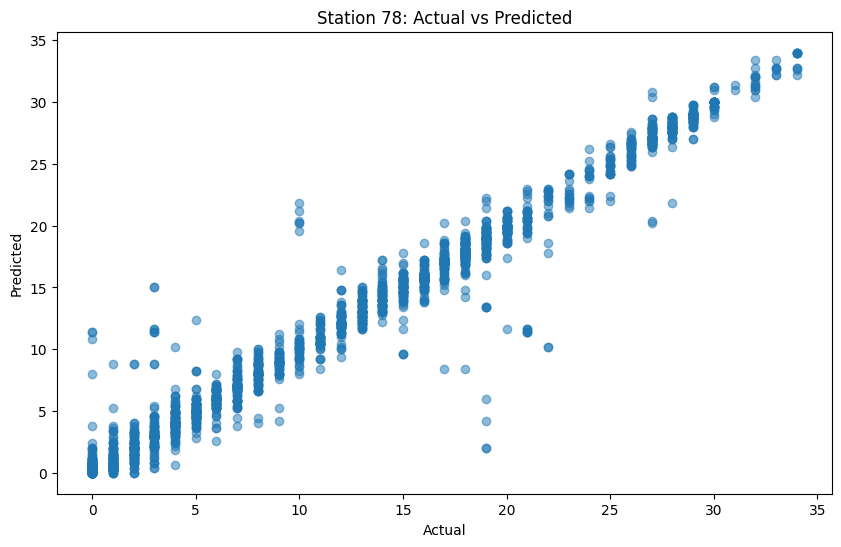

--------------------------------------------------
Number of predictions for station 79: 2479
new R^2 Score: 0.9503031881192663
Accuracy: 0.763210972166196


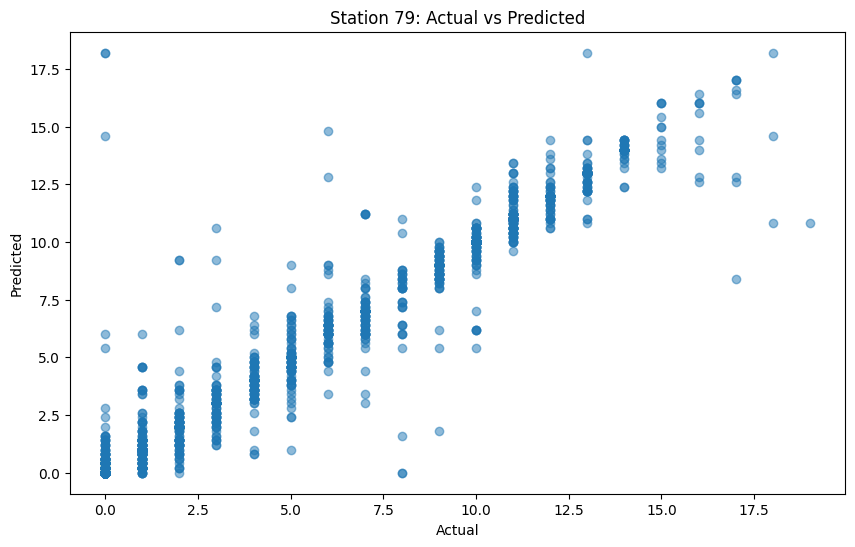

--------------------------------------------------
Number of predictions for station 80: 2703
new R^2 Score: 0.9467861086229051
Accuracy: 0.6466888642249352


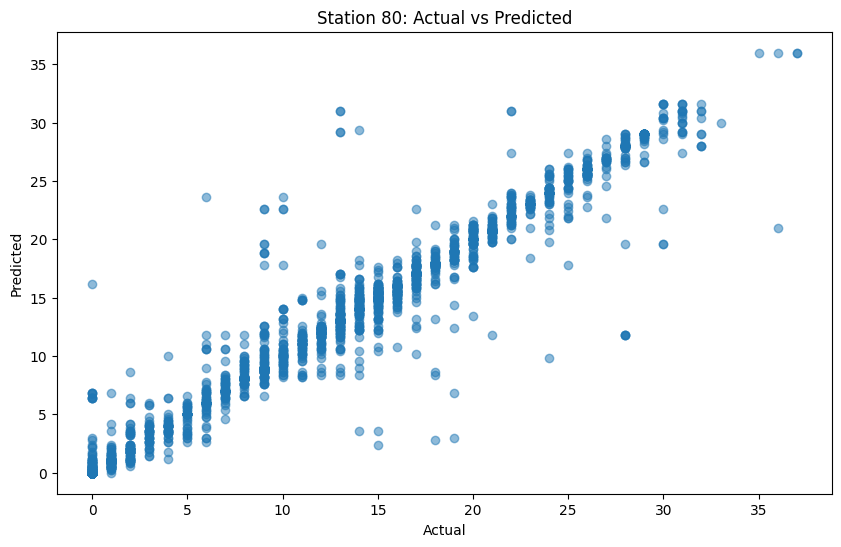

--------------------------------------------------
Number of predictions for station 82: 2502
new R^2 Score: 0.984248375658529
Accuracy: 0.718625099920064


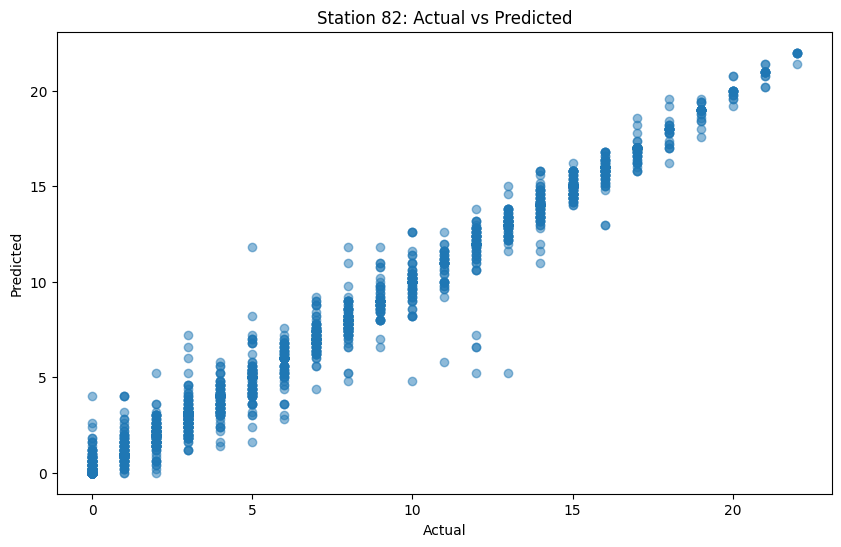

--------------------------------------------------
Number of predictions for station 83: 2716
new R^2 Score: 0.9792496938704356
Accuracy: 0.5787923416789397


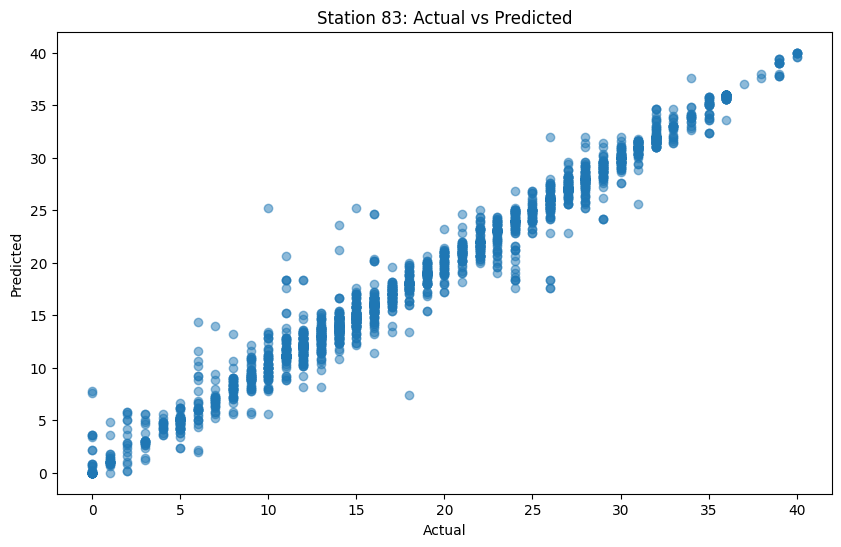

--------------------------------------------------
Number of predictions for station 84: 2595
new R^2 Score: 0.9809119250472472
Accuracy: 0.6732177263969171


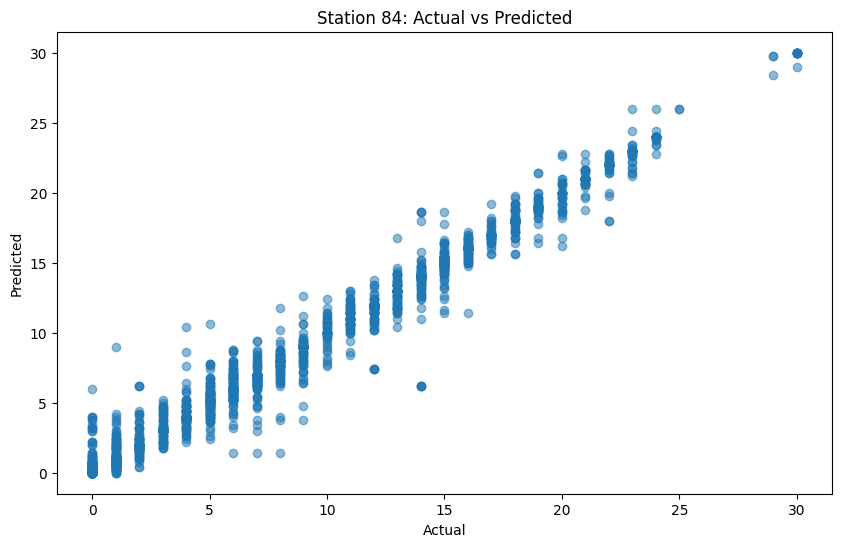

--------------------------------------------------
Number of predictions for station 85: 2649
new R^2 Score: 0.9686131455401852
Accuracy: 0.6055115137787844


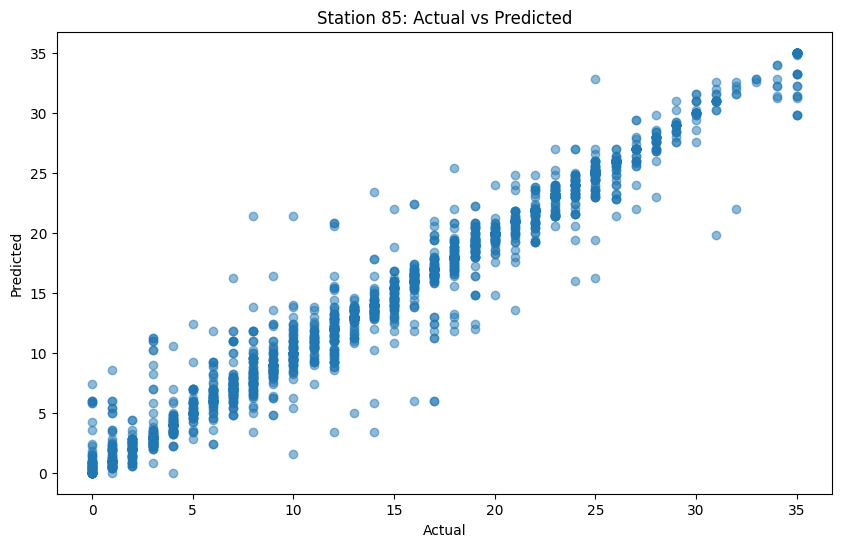

--------------------------------------------------
Number of predictions for station 86: 2842
new R^2 Score: 0.9751073351651879
Accuracy: 0.525686136523575


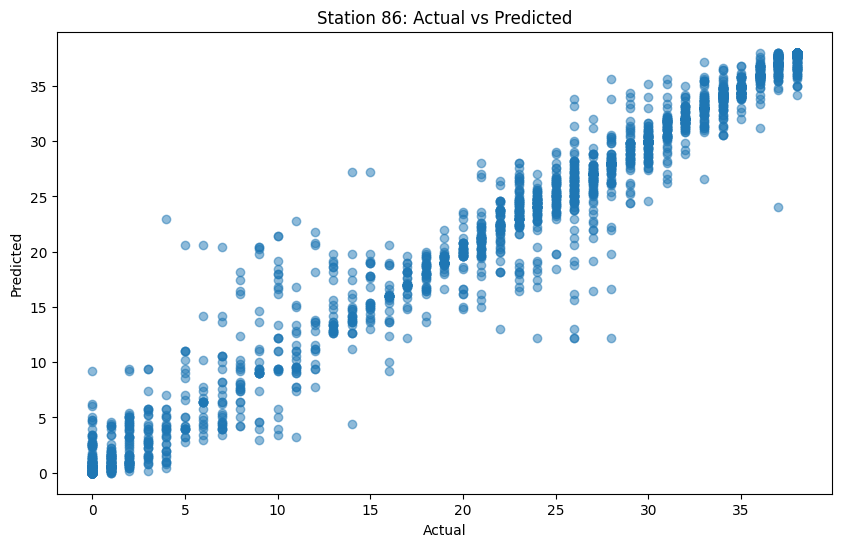

--------------------------------------------------
Number of predictions for station 87: 2674
new R^2 Score: 0.9838864391536216
Accuracy: 0.5908750934928946


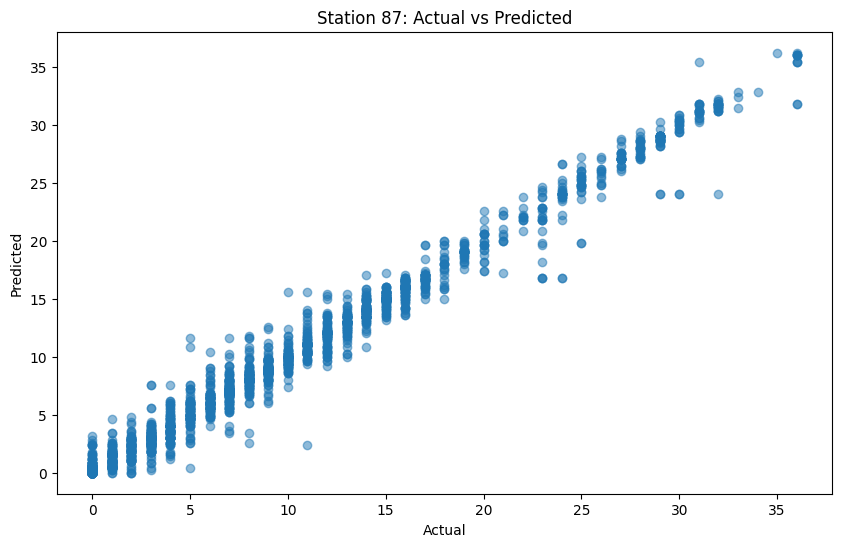

--------------------------------------------------
Number of predictions for station 88: 2731
new R^2 Score: 0.9700554914737913
Accuracy: 0.5309410472354449


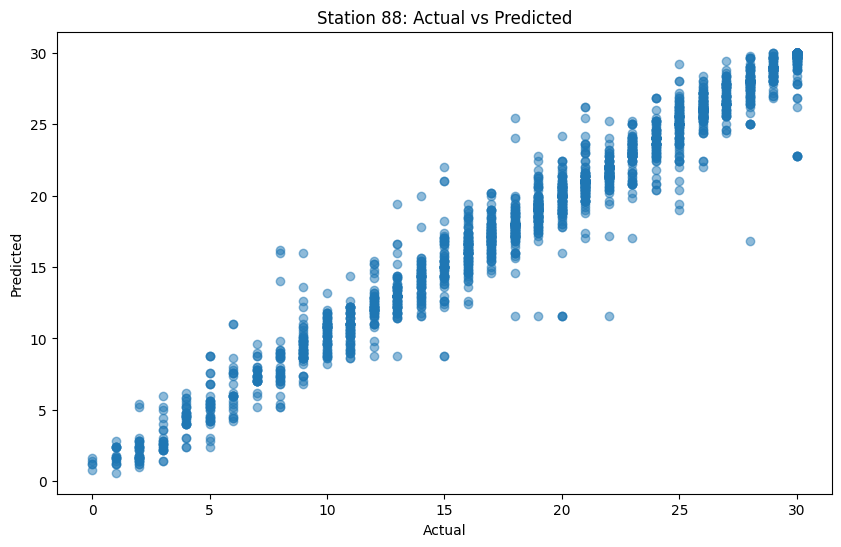

--------------------------------------------------
Number of predictions for station 89: 2537
new R^2 Score: 0.9637323876894335
Accuracy: 0.7280252266456445


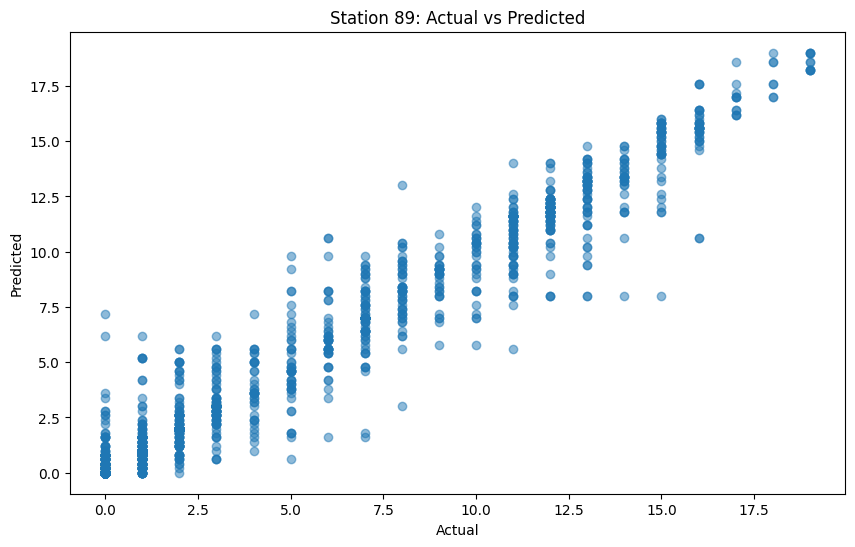

--------------------------------------------------
Number of predictions for station 90: 2922
new R^2 Score: 0.9622746099095356
Accuracy: 0.5065023956194388


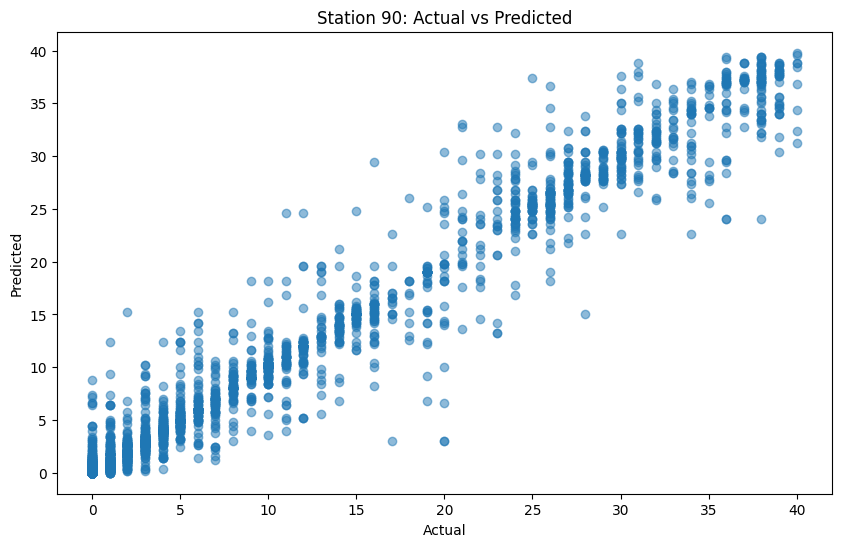

--------------------------------------------------
Number of predictions for station 91: 3037
new R^2 Score: 0.9470879114340915
Accuracy: 0.4399078037537043


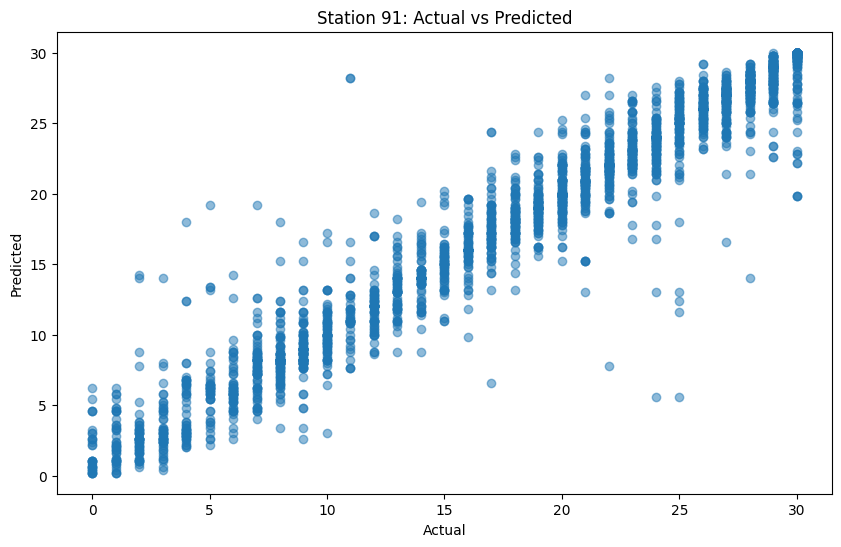

--------------------------------------------------
Number of predictions for station 92: 2762
new R^2 Score: 0.9731402417406704
Accuracy: 0.5959449674149168


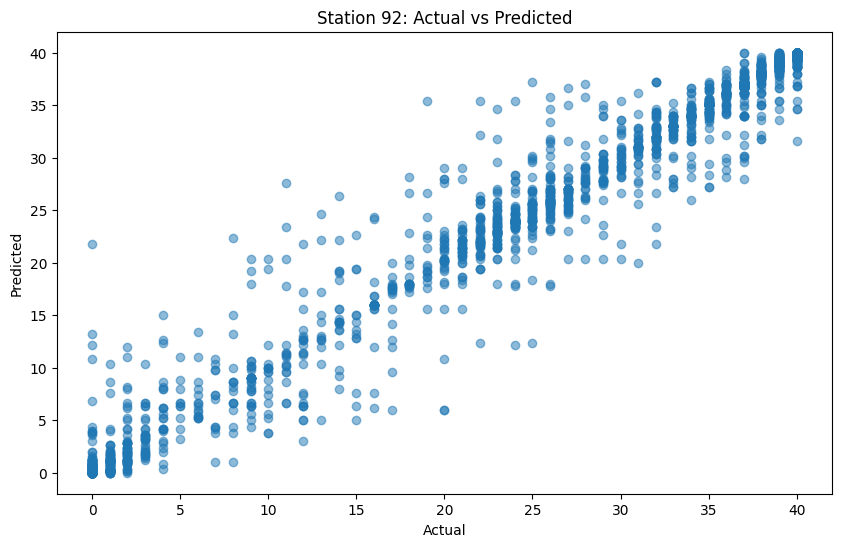

--------------------------------------------------
Number of predictions for station 93: 2557
new R^2 Score: 0.9651361318927473
Accuracy: 0.8013296832225264


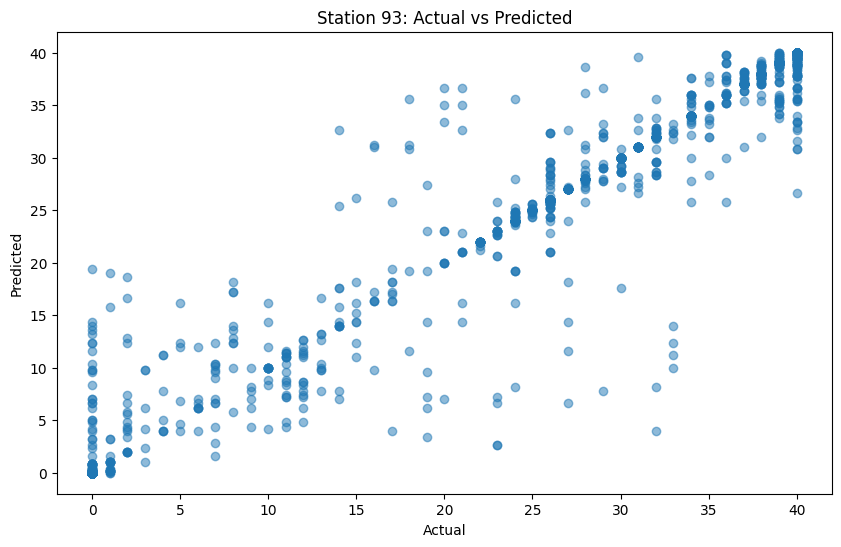

--------------------------------------------------
Number of predictions for station 94: 2530
new R^2 Score: 0.9834392478104041
Accuracy: 0.8312252964426877


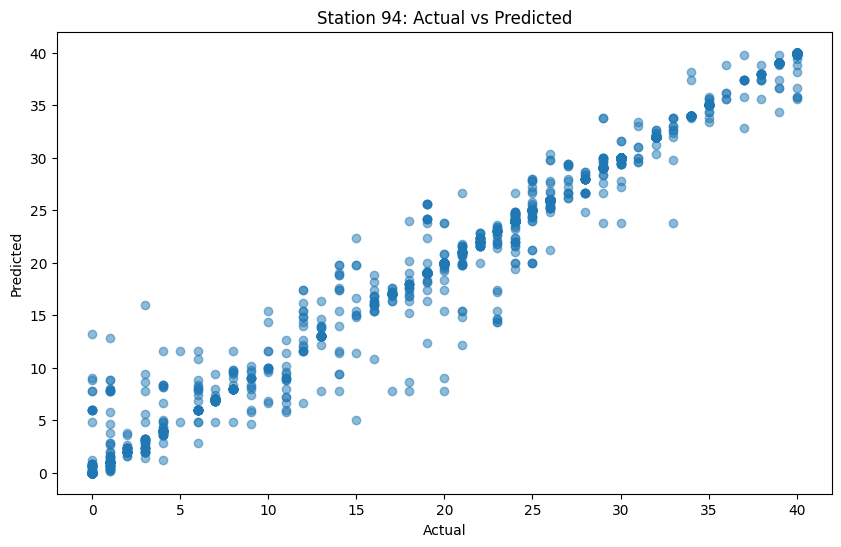

--------------------------------------------------
Number of predictions for station 95: 2800
new R^2 Score: 0.9802842350034489
Accuracy: 0.5367857142857143


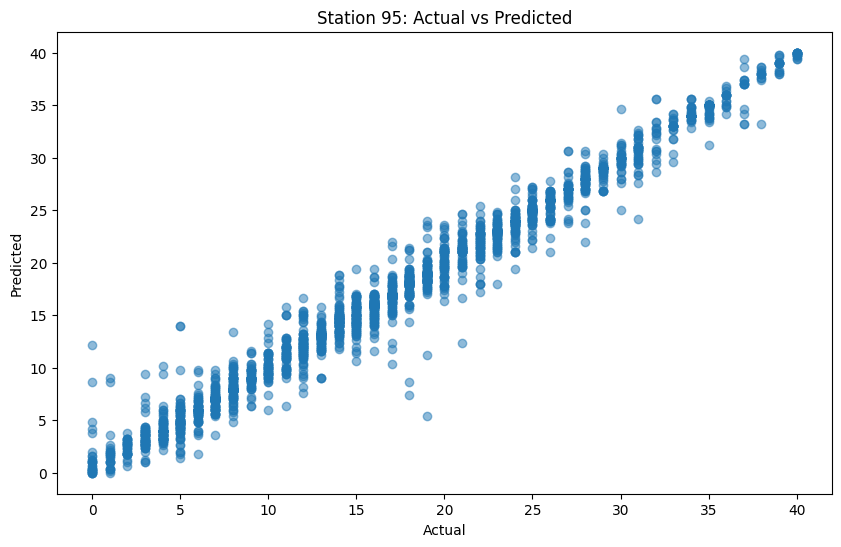

--------------------------------------------------
Number of predictions for station 96: 2429
new R^2 Score: 0.9775614123605102
Accuracy: 0.7661589131329766


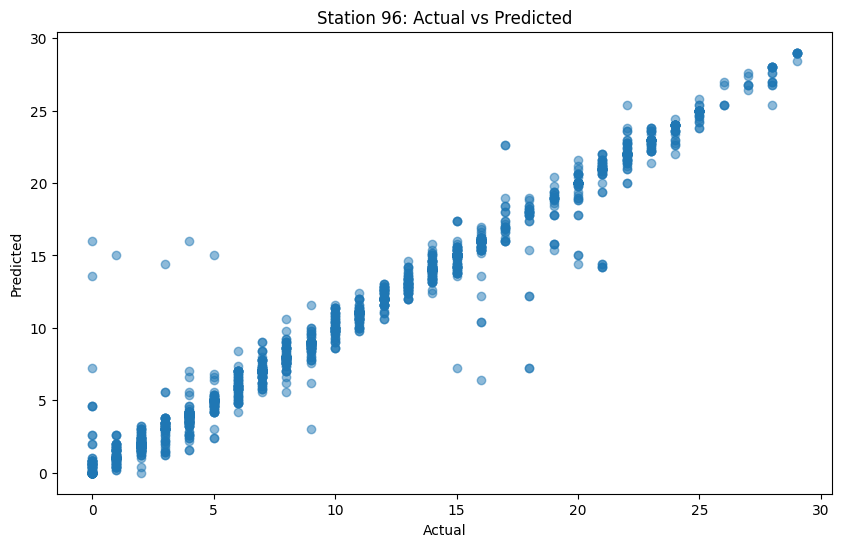

--------------------------------------------------
Number of predictions for station 97: 2728
new R^2 Score: 0.9473690567858933
Accuracy: 0.533724340175953


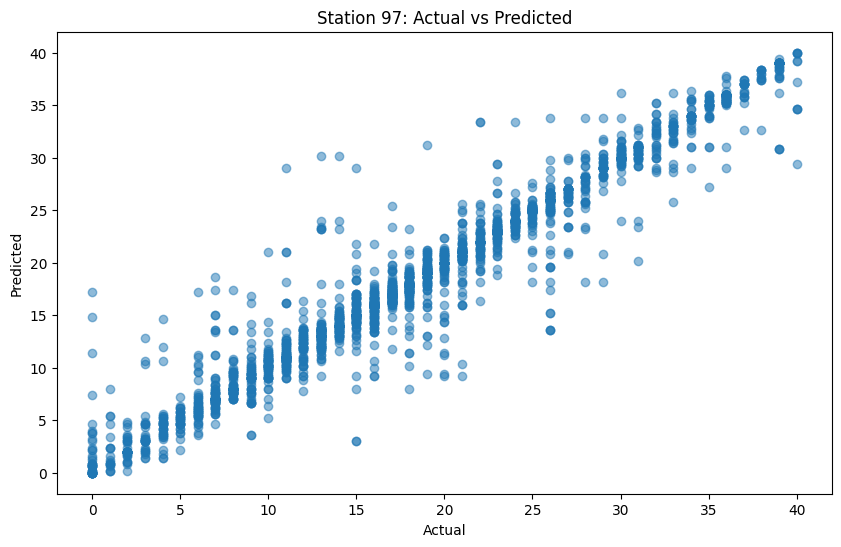

--------------------------------------------------
Number of predictions for station 98: 2665
new R^2 Score: 0.9856378956927407
Accuracy: 0.6157598499061914


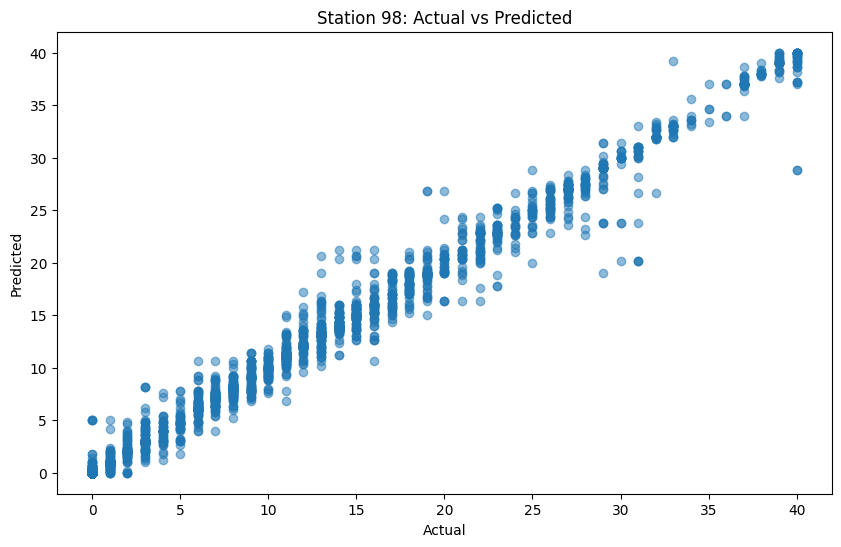

--------------------------------------------------
Number of predictions for station 99: 2671
new R^2 Score: 0.9806527034575399
Accuracy: 0.623736428304006


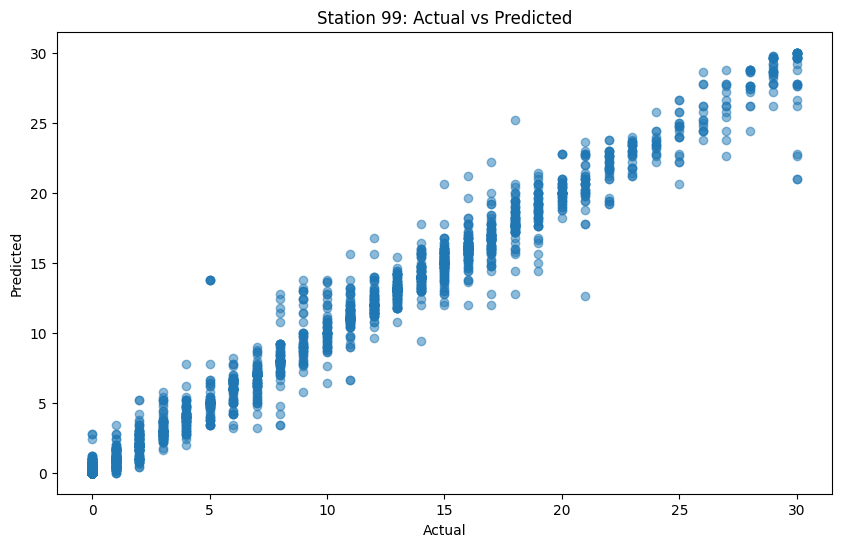

--------------------------------------------------
Number of predictions for station 100: 2808
new R^2 Score: 0.9450185287787298
Accuracy: 0.5316951566951567


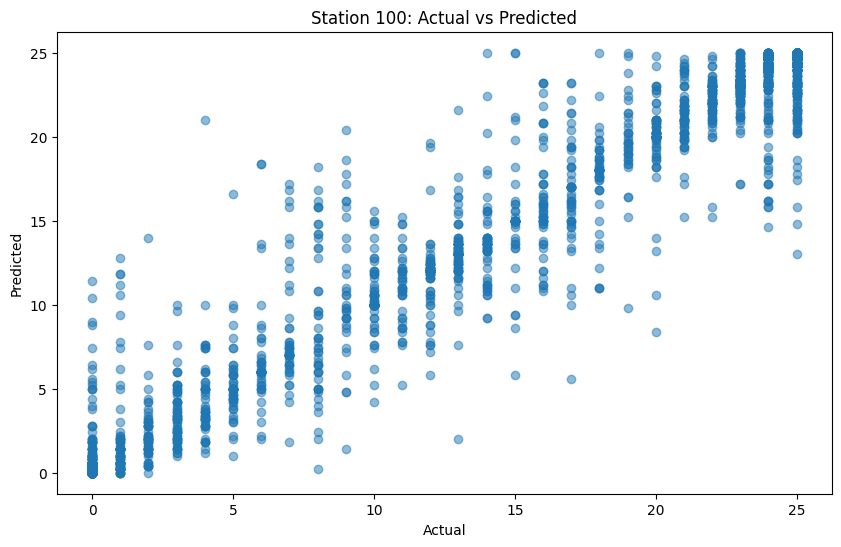

--------------------------------------------------
Number of predictions for station 101: 2728
new R^2 Score: 0.9745563528722431
Accuracy: 0.5201612903225806


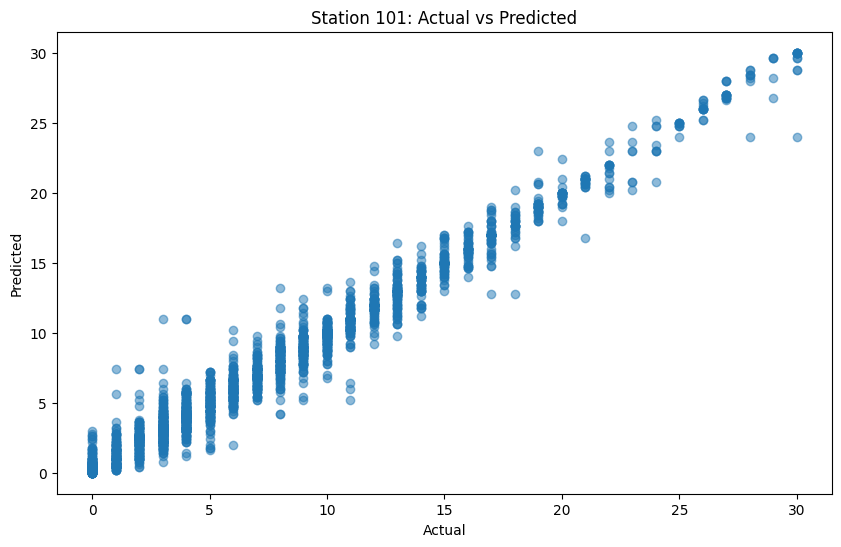

--------------------------------------------------
Number of predictions for station 102: 2580
new R^2 Score: 0.9489191210659632
Accuracy: 0.6325581395348837


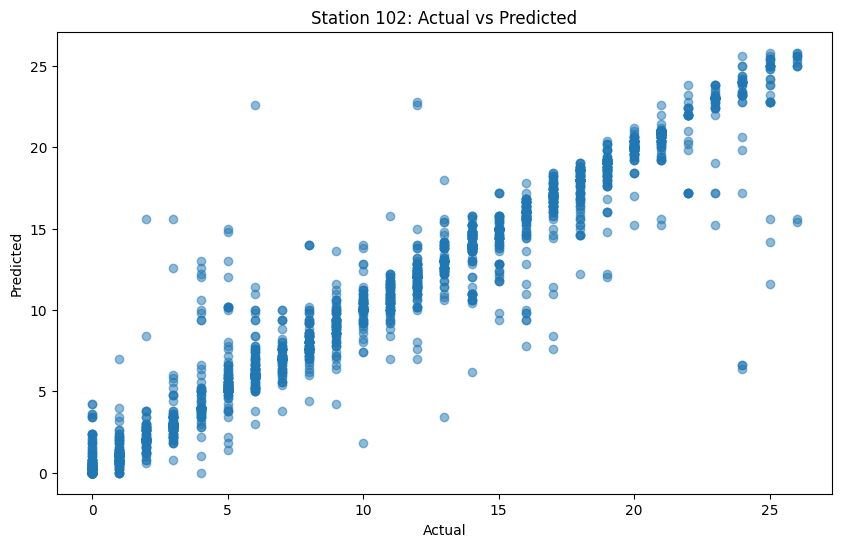

--------------------------------------------------
Number of predictions for station 103: 2578
new R^2 Score: 0.9520951402464345
Accuracy: 0.6772692009309542


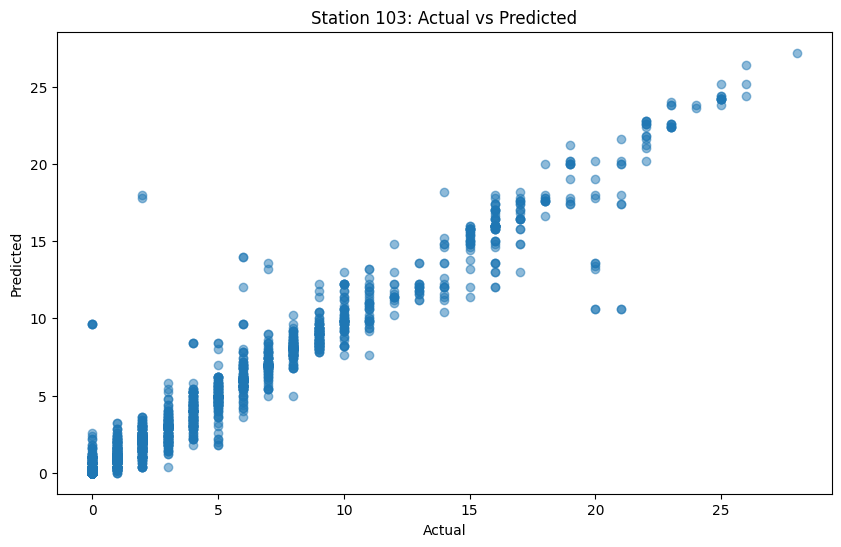

--------------------------------------------------
Number of predictions for station 104: 2454
new R^2 Score: 0.9756198618341496
Accuracy: 0.8520782396088019


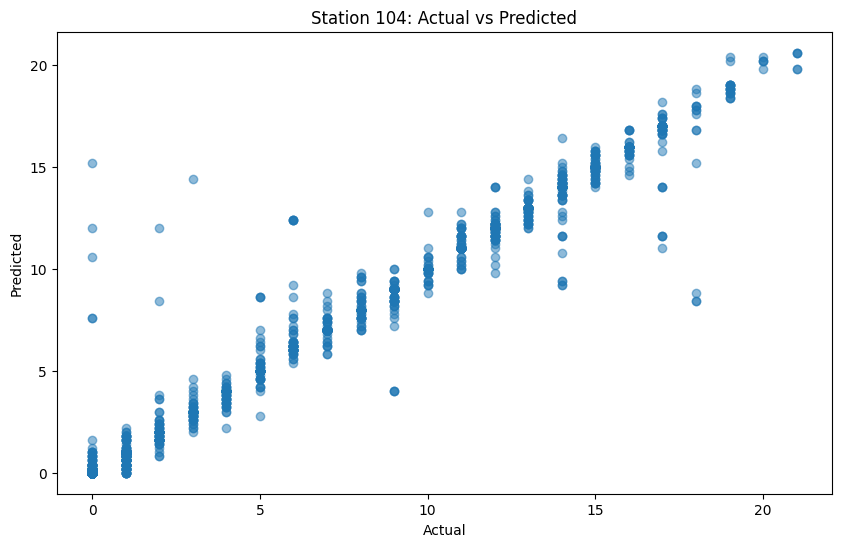

--------------------------------------------------
Number of predictions for station 105: 2517
new R^2 Score: 0.9678923021890432
Accuracy: 0.7572506952721494


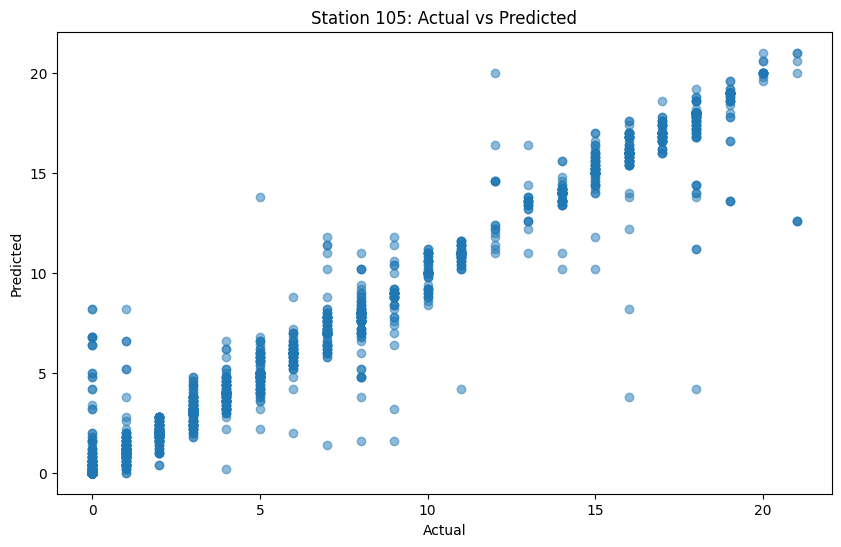

--------------------------------------------------
Number of predictions for station 106: 2568
new R^2 Score: 0.9235589290591092
Accuracy: 0.6269470404984424


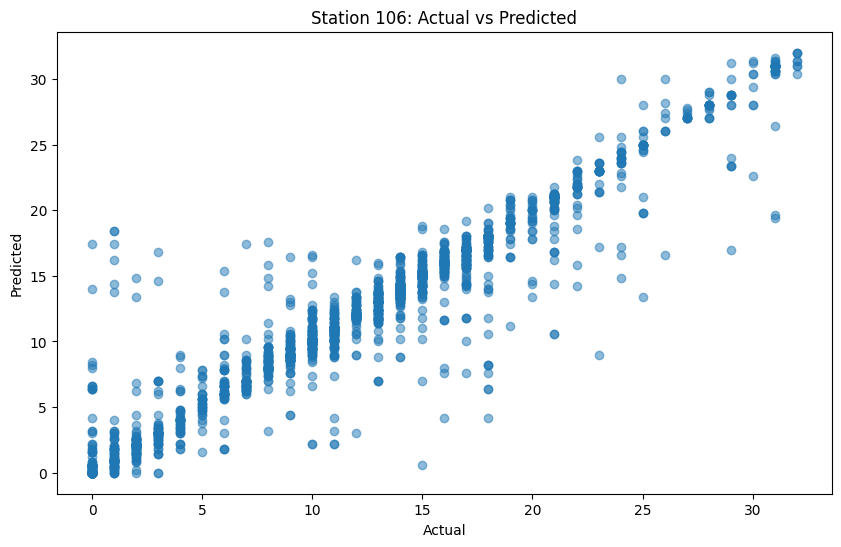

--------------------------------------------------
Number of predictions for station 107: 2653
new R^2 Score: 0.9533657746853073
Accuracy: 0.5887674330946099


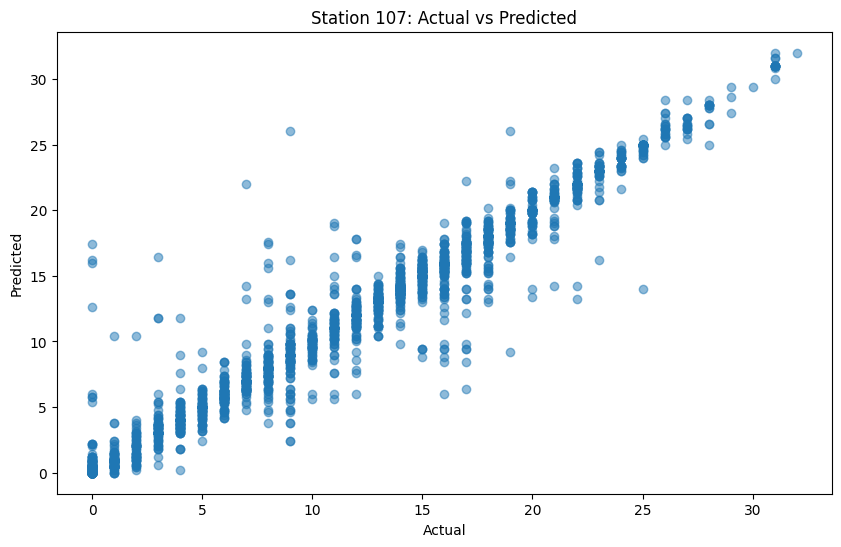

--------------------------------------------------
Number of predictions for station 108: 2665
new R^2 Score: 0.9507424790485063
Accuracy: 0.599624765478424


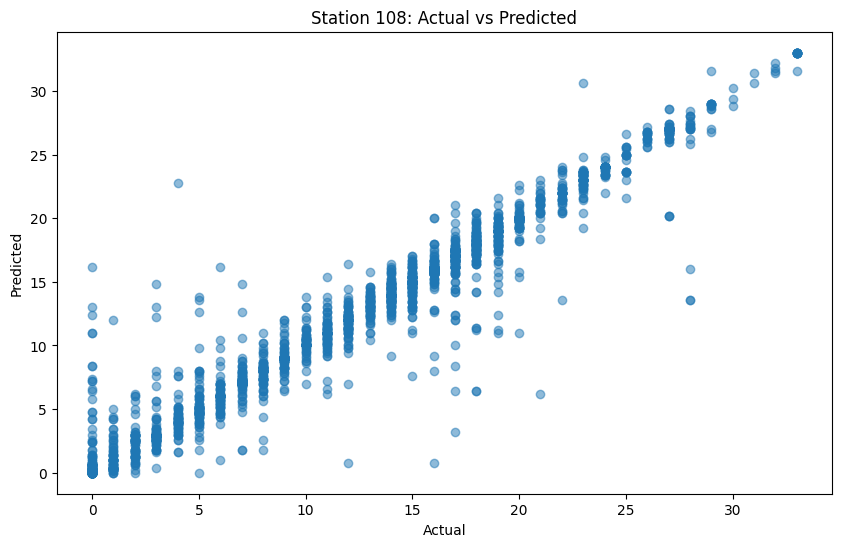

--------------------------------------------------
Number of predictions for station 109: 2743
new R^2 Score: 0.9771273121053586
Accuracy: 0.5617936565803865


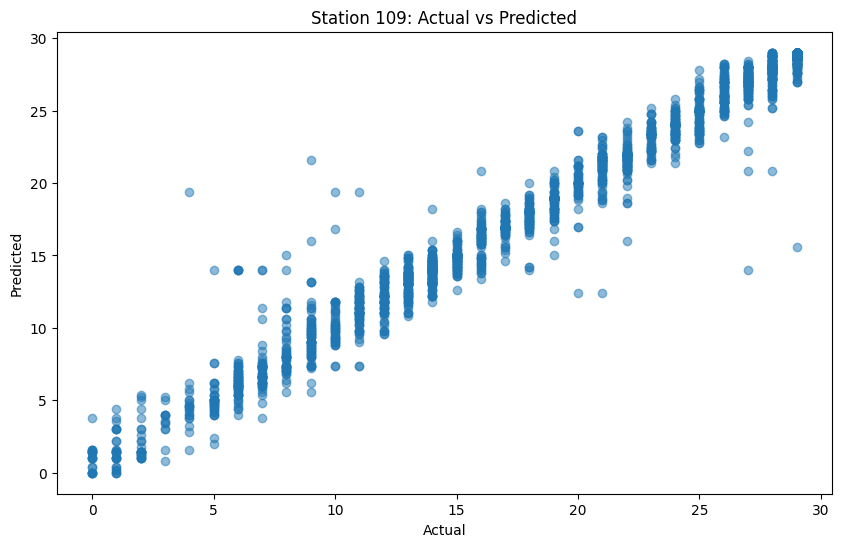

--------------------------------------------------
Number of predictions for station 110: 2622
new R^2 Score: 0.9726580628342524
Accuracy: 0.6296720061022121


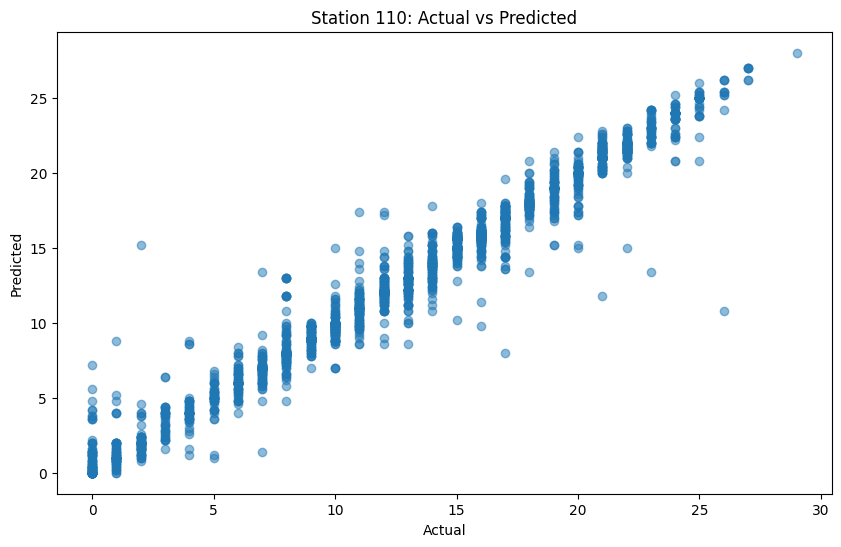

--------------------------------------------------
Number of predictions for station 111: 2702
new R^2 Score: 0.9634202061326002
Accuracy: 0.5532938564026647


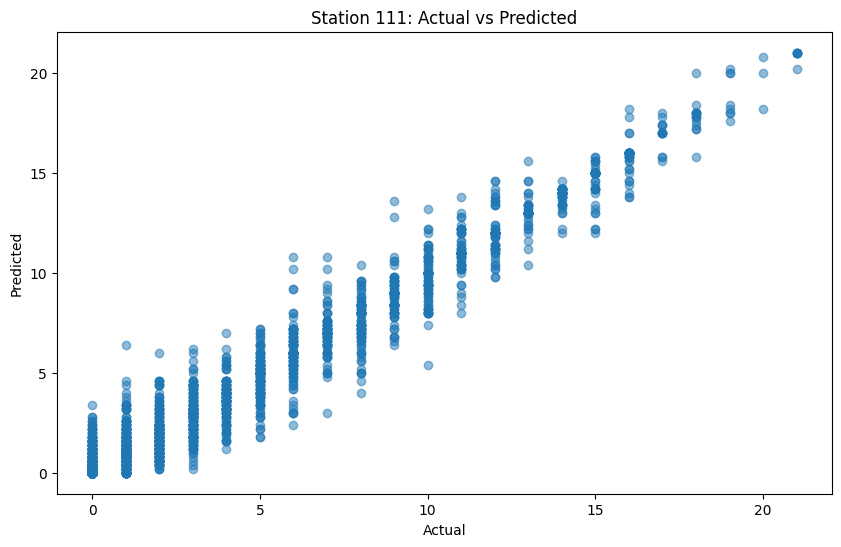

--------------------------------------------------
Number of predictions for station 112: 2930
new R^2 Score: 0.9662468592437649
Accuracy: 0.4279863481228669


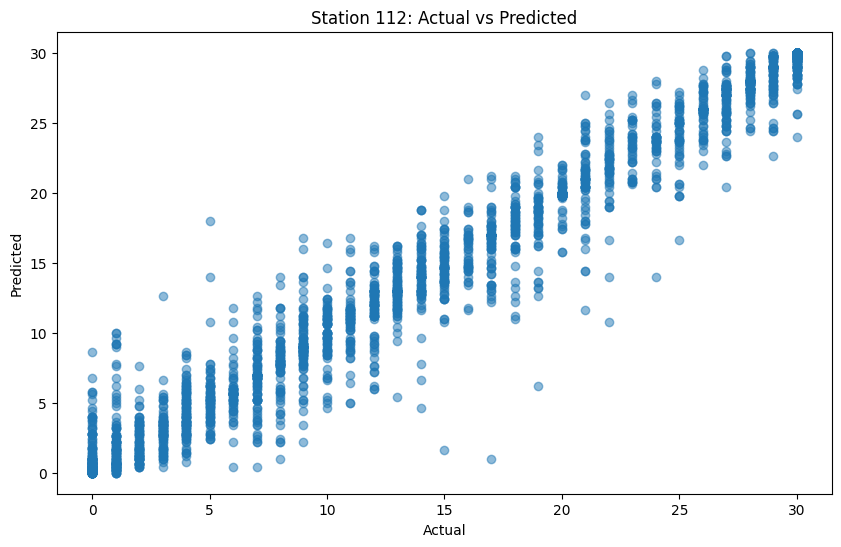

--------------------------------------------------
Number of predictions for station 113: 2488
new R^2 Score: 0.9868210983028272
Accuracy: 0.7552250803858521


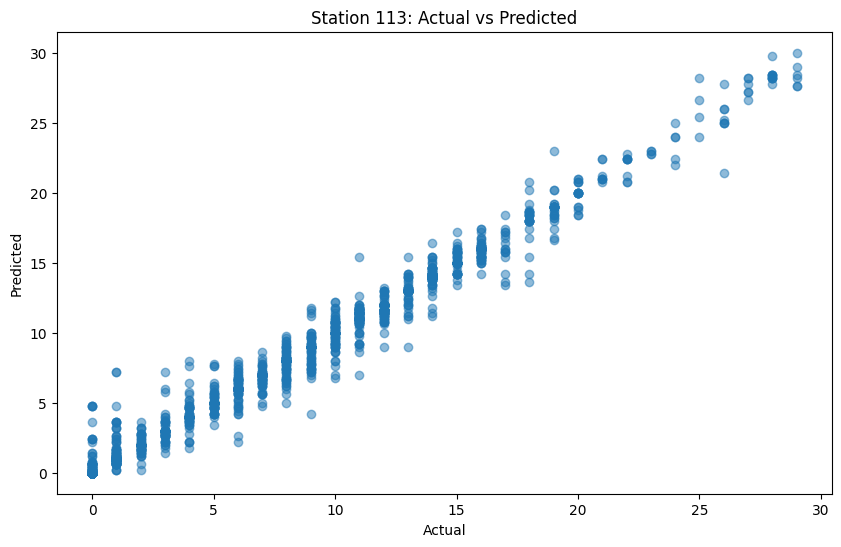

--------------------------------------------------
Number of predictions for station 114: 2854
new R^2 Score: 0.9665546383901571
Accuracy: 0.49579537491240366


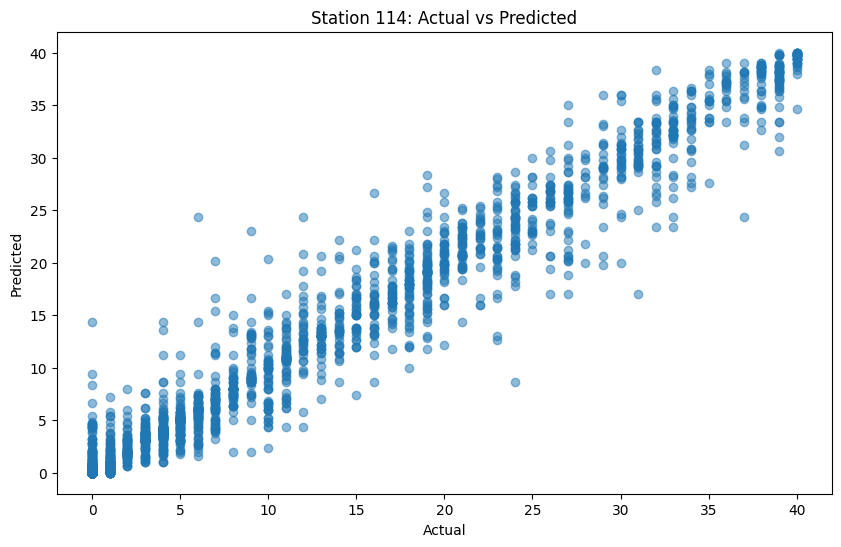

--------------------------------------------------
Number of predictions for station 115: 3001
new R^2 Score: 0.9741592346079752
Accuracy: 0.5044985004998334


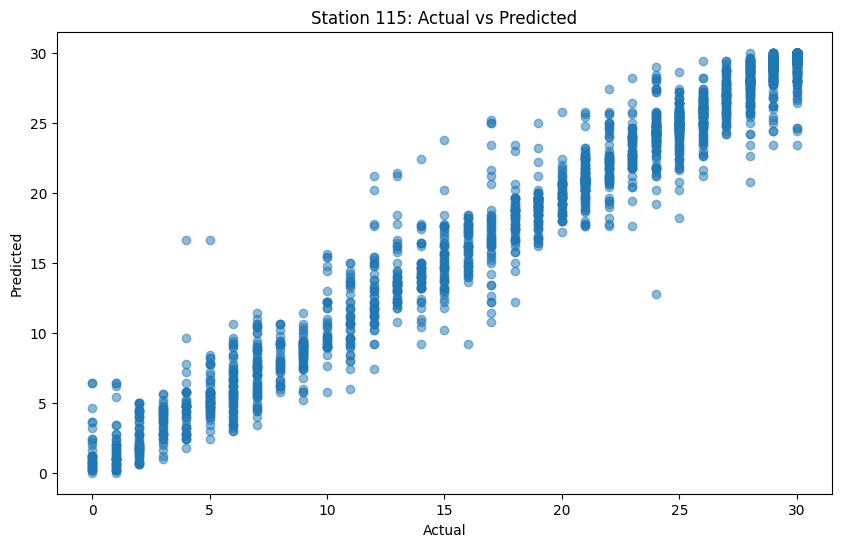

--------------------------------------------------
Number of predictions for station 116: 2444
new R^2 Score: 0.9628615657642129
Accuracy: 0.7246317512274959


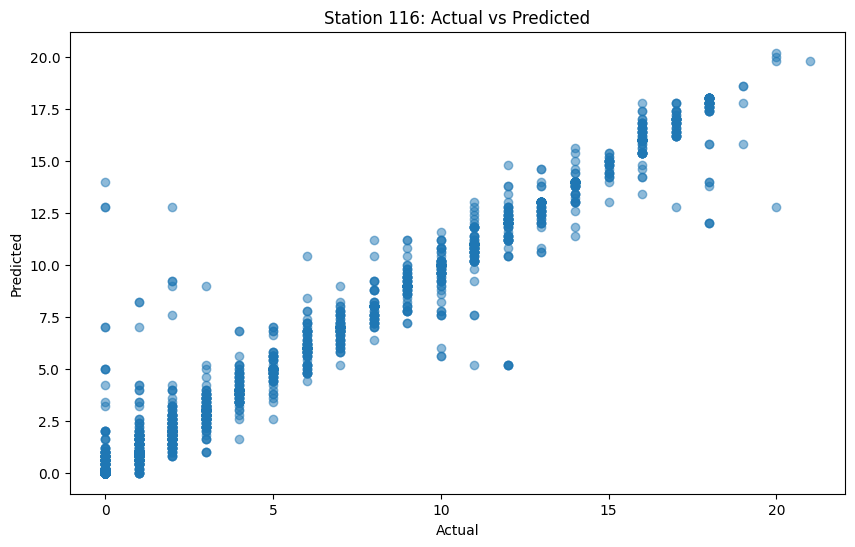

--------------------------------------------------
Number of predictions for station 117: 2574
new R^2 Score: 0.9815431775854193
Accuracy: 0.6480186480186481


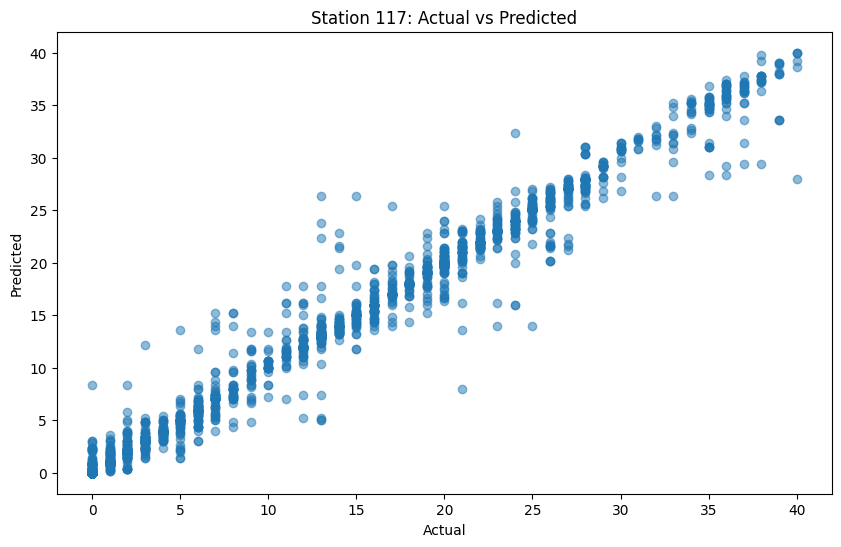

--------------------------------------------------


In [44]:
stations = df["number"].unique()

models = {}
if not os.path.exists("models_availability"):
    os.makedirs("models_availability")


"""
Effectively, we are giving the model the following information:
temp
feels_like	
wind_speed	
humidity		
year	
month	
day	
hour	
minute	
day_of_week
"""

for station in stations:
    df_station = df[df["number"] == station]

    X = df_station.drop(
        [
            "time",
            "date",
            "available_bikes",
            "number",
            "available_bike_stands",
            "lon",
            "lat",
            "id",
            "weather_description",
            "curr_time",
            "last_update",
        ],
        axis=1,
    )
    y = df_station["available_bikes"]

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train a KNN model
    model = KNeighborsRegressor()
    model.fit(X_train, y_train)

    # Store the model in the dictionary
    models[station] = model

    # Serialize model
    dump(model, f"models_availability/model_availability{station}.joblib")

    # Make predictions on the testing data
    y_pred = model.predict(X_test)
    print(f"Number of predictions for station {station}: {len(y_pred)}")

    # Evaluate the model
    r2_score = model.score(X_test, y_test)
    print(f"R^2 Score: {r2_score}")
    y_pred_rounded = np.round(y_pred)

    accuracy = accuracy_score(y_test, y_pred_rounded)
    print(f"Accuracy: {accuracy}")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plt.title(f"Station {station}: Actual vs Predicted")
    plt.show()
    print("--------------------------------------------------")